# Info Hardware Virtuale

In [ ]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 85
model name	: Intel(R) Xeon(R) CPU @ 2.00GHz
stepping	: 3
microcode	: 0xffffffff
cpu MHz		: 2000.184
cache size	: 39424 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm mpx avx512f avx512dq rdseed adx smap clflushopt clwb avx512cd avx512bw avx512vl xsaveopt xsavec xgetbv1 xsaves arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmi

In [ ]:
! nvidia-smi

Tue Jun 10 09:34:39 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   59C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!cat /etc/*release

DISTRIB_ID=Ubuntu
DISTRIB_RELEASE=22.04
DISTRIB_CODENAME=jammy
DISTRIB_DESCRIPTION="Ubuntu 22.04.4 LTS"
PRETTY_NAME="Ubuntu 22.04.4 LTS"
NAME="Ubuntu"
VERSION_ID="22.04"
VERSION="22.04.4 LTS (Jammy Jellyfish)"
VERSION_CODENAME=jammy
ID=ubuntu
ID_LIKE=debian
HOME_URL="https://www.ubuntu.com/"
SUPPORT_URL="https://help.ubuntu.com/"
BUG_REPORT_URL="https://bugs.launchpad.net/ubuntu/"
PRIVACY_POLICY_URL="https://www.ubuntu.com/legal/terms-and-policies/privacy-policy"
UBUNTU_CODENAME=jammy


# Import

In [1]:
!pip install pykan

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.1/78.1 kB 1.9 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from time import mktime
from datetime import datetime, timedelta
import sklearn
from sklearn.model_selection import GridSearchCV
import torch
from kan import *
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import accuracy_score
# !pip install tensorflow
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import History
# !pip install ipyfilechooser
import medigui_convnet as medigui

# Full dataset

In [ ]:
# Load full dataset
X, y = medigui.LoadImageArchive('ALZ.training.set.pickle')

In [ ]:
pd.DataFrame(y).sum(axis=0)

,0
0,9600.0
1,6464.0
2,8960.0
3,8960.0


In [ ]:
X.shape

(33984, 100, 100)

# Salvare dataset ridotto

In [ ]:
# Generate reduced dataset
X_train, X_test, Y_train, Y_test = medigui.splitDataset(X=X, Y=y, test_size=0.15, random_state=42)
XX_save = X_test
YY_save = Y_test

In [ ]:
# Save reduced dataset
import pickle

# Define the filename for the pickle file
pickle_filename = 'ALZ_reduced_dataset_CNN.pkl'

# Save X_test and Y_test to the pickle file
with open(pickle_filename, 'wb') as f:
    pickle.dump({'X': XX_save, 'Y': YY_save}, f)

print(f"X_reduced and Y_reduced saved to {pickle_filename}")

X_reduced and Y_reduced saved to ALZ_reduced_dataset.pkl


# Caricare dataset ridotto

In [ ]:
# Load dataset

import pickle

# Define the filename for the pickle file
pickle_filename = 'ALZ_reduced_dataset_CNN.pkl'

with open(pickle_filename, 'rb') as f:
    loaded_data = pickle.load(f)
X = loaded_data['X']
y = loaded_data['Y']

print("Data loaded successfully.")
print("Loaded X_test shape:", X.shape)
print("Loaded Y_test shape:", y.shape)

Data loaded successfully.
Loaded X_test shape: (5098, 100, 100)
Loaded Y_test shape: (5098, 4)


# Creazione e training CNN

## Def e dataset split

In [ ]:
def trainCNN(X_train, X_test, Y_train, Y_test, epochs, batch_size):
    # Assicurati di avere i tuoi dati di addestramento (train_images) e le relative etichette (train_labels)
    # Assicurati di avere anche i tuoi dati di test (test_images) e le relative etichette (test_labels)

    # Addestramento del modello
    history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, Y_test))

    # Valutazione del modello
    test_loss, test_acc = model.evaluate(X_test, Y_test)
    print(f'Test accuracy: {test_acc}')

    # Visualizzazione delle curve di apprendimento

    plt.plot(history.history['accuracy'], label='accuracy')
    plt.plot(history.history['val_accuracy'], label='val_accuracy')
    plt.plot(history.history['loss'], label='loss')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    plt.show()
    plt.close()

    return model

In [ ]:
X_train, X_test, Y_train, Y_test = medigui.splitDataset(X=X, Y=y, test_size=0.2, random_state=42)

In [ ]:
# Verify the arrays
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("Y_train shape:", Y_train.shape)
print("Y_test shape:", Y_test.shape)

X_train shape: (4078, 100, 100)
X_test shape: (1020, 100, 100)
Y_train shape: (4078, 4)
Y_test shape: (1020, 4)


## Create new CNN

In [ ]:
model = medigui.defineModel(X=X, Y=y,
              Conv2D_1_filters=44, Conv2D_1_kernelSize=3,  C2D_1_activation='relu', MP2D_1_filters=2,
                Conv2D_2_filters=128, Conv2D_2_kernelSize=3,  C2D_2_activation='relu', MP2D_2_filters=2,
                Conv2D_3_filters=256, Conv2D_3_kernelSize=3,  C2D_3_activation='relu', MP2D_3_filters=2,
                Conv2D_4_filters=512, Conv2D_4_kernelSize=3,  C2D_4_activation='relu', MP2D_4_filters=2,
                Conv2D_5_filters=512, Conv2D_5_kernelSize=3,  C2D_5_activation='relu', MP2D_5_filters=2,
                Dense_1_filters=128, Dense_1_activation='relu', l1=0.001, l2=0.001,
                Dense_2_activation='softmax')

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


## Load pre-trained CNN

In [ ]:
# Load the trained CNN model
model = models.load_model('CNN_trained_14epochs_ALZ_reduced_dataset.keras')

## Training

In [ ]:
# XX = X[:1000]
# YY = y[:1000]

# XX_train, XX_test, YY_train, YY_test = medigui.splitDataset(X=XX, Y=YY, test_size=0.2, random_state=42)

# model = medigui.defineModel(X=X, Y=y,
#               Conv2D_1_filters=44, Conv2D_1_kernelSize=3,  C2D_1_activation='relu', MP2D_1_filters=2,
#                 Conv2D_2_filters=128, Conv2D_2_kernelSize=3,  C2D_2_activation='relu', MP2D_2_filters=2,
#                 Conv2D_3_filters=256, Conv2D_3_kernelSize=3,  C2D_3_activation='relu', MP2D_3_filters=2,
#                 Conv2D_4_filters=512, Conv2D_4_kernelSize=3,  C2D_4_activation='relu', MP2D_4_filters=2,
#                 Conv2D_5_filters=512, Conv2D_5_kernelSize=3,  C2D_5_activation='relu', MP2D_5_filters=2,
#                 Dense_1_filters=128, Dense_1_activation='relu', l1=0.001, l2=0.001,
#                 Dense_2_activation='softmax')

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


Using CPU
Epoch 1/6
128/128 ━━━━━━━━━━━━━━━━━━━━ 1146s 9s/step - accuracy: 0.7517 - loss: 0.5770 - val_accuracy: 0.7147 - val_loss: 0.6965
Epoch 2/6
128/128 ━━━━━━━━━━━━━━━━━━━━ 1115s 9s/step - accuracy: 0.7817 - loss: 0.5281 - val_accuracy: 0.7010 - val_loss: 0.7239
Epoch 3/6
128/128 ━━━━━━━━━━━━━━━━━━━━ 1068s 8s/step - accuracy: 0.8147 - loss: 0.4679 - val_accuracy: 0.6863 - val_loss: 0.8272
Epoch 4/6
128/128 ━━━━━━━━━━━━━━━━━━━━ 1123s 9s/step - accuracy: 0.8316 - loss: 0.4227 - val_accuracy: 0.7069 - val_loss: 0.7367
Epoch 5/6
128/128 ━━━━━━━━━━━━━━━━━━━━ 1082s 8s/step - accuracy: 0.8664 - loss: 0.3640 - val_accuracy: 0.7206 - val_loss: 0.7628
Epoch 6/6
128/128 ━━━━━━━━━━━━━━━━━━━━ 1100s 9s/step - accuracy: 0.8829 - loss: 0.3192 - val_accuracy: 0.7431 - val_loss: 0.7328
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 550ms/step - accuracy: 0.7591 - loss: 0.7068
Test accuracy: 0.7431372404098511


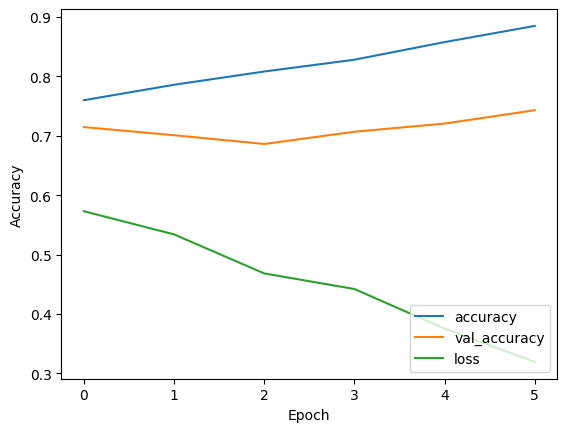

In [ ]:
ep = 6
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using GPU:", torch.cuda.get_device_name(0))
    with tf.device('/device:GPU:0'):
      model_medigui = trainCNN(X_train=X_train, X_test=X_test, Y_train=Y_train, Y_test=Y_test, epochs=ep, batch_size=32)
else:
    device = torch.device("cpu")
    print("Using CPU")
    model_medigui = trainCNN(X_train=X_train, X_test=X_test, Y_train=Y_train, Y_test=Y_test, epochs=ep, batch_size=32)

# with tf.device('/device:GPU:0'):
#   model_medigui = trainCNN(X_train=X_train, X_test=X_test, Y_train=Y_train, Y_test=Y_test, epochs=3, batch_size=32)

# Circa 45 min per 3 epochs

Using CPU
Epoch 1/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1089s 9s/step - accuracy: 0.8936 - loss: 0.2940 - val_accuracy: 0.7490 - val_loss: 0.7167
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1106s 9s/step - accuracy: 0.9286 - loss: 0.2317 - val_accuracy: 0.7314 - val_loss: 0.9007
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1071s 8s/step - accuracy: 0.9171 - loss: 0.2431 - val_accuracy: 0.7480 - val_loss: 0.8427
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1116s 8s/step - accuracy: 0.9595 - loss: 0.1545 - val_accuracy: 0.7304 - val_loss: 0.9698
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1100s 8s/step - accuracy: 0.9629 - loss: 0.1408 - val_accuracy: 0.7520 - val_loss: 0.9150
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1092s 8s/step - accuracy: 0.9709 - loss: 0.1163 - val_accuracy: 0.7490 - val_loss: 0.9923
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1076s 8s/step - accuracy: 0.9842 - loss: 0.0964 - val_accuracy: 0.7627 - val_loss: 0.9610
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1090s 8s/step - accuracy: 0.9864 - loss:

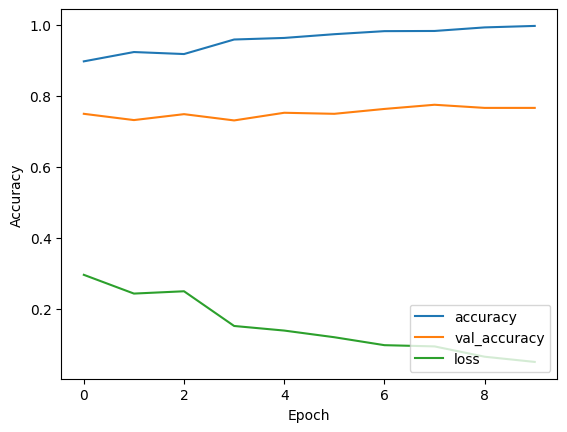

In [ ]:
ep = 10
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using GPU:", torch.cuda.get_device_name(0))
    with tf.device('/device:GPU:0'):
      model_medigui = trainCNN(X_train=X_train, X_test=X_test, Y_train=Y_train, Y_test=Y_test, epochs=ep, batch_size=32)
else:
    device = torch.device("cpu")
    print("Using CPU")
    model_medigui = trainCNN(X_train=X_train, X_test=X_test, Y_train=Y_train, Y_test=Y_test, epochs=ep, batch_size=32)

# with tf.device('/device:GPU:0'):
#   model_medigui = trainCNN(X_train=X_train, X_test=X_test, Y_train=Y_train, Y_test=Y_test, epochs=3, batch_size=32)

# Circa 45 min per 3 epochs

## Save CNN

In [ ]:
# Save model in .keras file
model.save('CNN_trained_30epochs_ALZ_reduced_dataset.keras')

## Load CNN

In [ ]:
# Load the trained CNN model
model = models.load_model('CNN_trained_20epochs_ALZ_reduced_dataset.keras')

## Some junk

In [ ]:
def trainCNN(X_train, X_test, Y_train, Y_test, epochs, batch_size):
    # Addestramento del modello
    history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, Y_test))

    # Valutazione del modello
    test_loss, test_acc = model.evaluate(X_test, Y_test)
    print(f'Test accuracy: {test_acc}')

    # Visualizzazione delle curve di apprendimento

    plt.plot(history.history['accuracy'], label='accuracy')
    plt.plot(history.history['val_accuracy'], label='val_accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    #plt.show()
    plt.close()

    return model

In [ ]:
# Nel paper 30 epochs
model = trainCNN(X_train=X_train, X_test=X_test, Y_train=Y_train, Y_test=Y_test, epochs=1, batch_size=32)

Epoch 1/30
850/850 ━━━━━━━━━━━━━━━━━━━━ 1286s 2s/step - accuracy: 0.3089 - loss: 1.8957 - val_accuracy: 0.5985 - val_loss: 0.8318
Epoch 2/30
850/850 ━━━━━━━━━━━━━━━━━━━━ 1286s 2s/step - accuracy: 0.6165 - loss: 0.8177 - val_accuracy: 0.6859 - val_loss: 0.6921
Epoch 3/30
850/850 ━━━━━━━━━━━━━━━━━━━━ 1275s 2s/step - accuracy: 0.6915 - loss: 0.6906 - val_accuracy: 0.7062 - val_loss: 0.6371
Epoch 4/30
850/850 ━━━━━━━━━━━━━━━━━━━━ 1267s 1s/step - accuracy: 0.7482 - loss: 0.5826 - val_accuracy: 0.7690 - val_loss: 0.5304
Epoch 5/30
850/850 ━━━━━━━━━━━━━━━━━━━━ 1274s 1s/step - accuracy: 0.7957 - loss: 0.4811 - val_accuracy: 0.7996 - val_loss: 0.4731
Epoch 6/30
850/850 ━━━━━━━━━━━━━━━━━━━━ 1282s 2s/step - accuracy: 0.8319 - loss: 0.4054 - val_accuracy: 0.8223 - val_loss: 0.4298
Epoch 7/30
282/850 ━━━━━━━━━━━━━━━━━━━━ 13:23 1s/step - accuracy: 0.8623 - loss: 0.3506

# Prova CNN

## Test CNN

In [ ]:
# Valutazione del modello
# with tf.device('/device:GPU:0'):
  # test_loss, test_acc = model.evaluate(X_test, Y_test)
test_loss, test_acc = model.evaluate(X_test, Y_test)
print(f'Test accuracy: {test_acc}')

32/32 ━━━━━━━━━━━━━━━━━━━━ 20s 605ms/step - accuracy: 0.7775 - loss: 1.2177
Test accuracy: 0.7656862735748291


In [ ]:
y_pred_CNN = model.predict(X_test)
y_true = np.argmax(Y_test, axis=1)
y_pred_CNN_labels = np.argmax(y_pred_CNN, axis=1)

32/32 ━━━━━━━━━━━━━━━━━━━━ 20s 621ms/step


In [ ]:
y_pred_CNN

array([[1.8425788e-05, 9.4447540e-11, 9.9798477e-01, 1.9968071e-03],
       [1.0293675e-01, 1.0404177e-18, 1.5113986e-05, 8.9704812e-01],
       [1.0294823e-07, 8.7302103e-11, 9.9998975e-01, 1.0132444e-05],
       ...,
       [8.2855088e-01, 1.4997089e-14, 1.2835078e-07, 1.7144904e-01],
       [9.2306623e-04, 2.1679615e-08, 6.8595678e-01, 3.1312016e-01],
       [4.2822506e-02, 1.3688461e-01, 2.4749666e-02, 7.9554325e-01]],
      dtype=float32)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# y_true_np_CNN = y_true.cpu().numpy()
# y_pred_np_CNN = y_pred_CNN_labels.cpu().numpy()

print(confusion_matrix(y_true, y_pred_CNN_labels))
print(classification_report(y_true, y_pred_CNN_labels))

[[214   2  10  41]
 [  2 183   4   1]
 [ 18   3 202  47]
 [ 76   3  32 182]]
              precision    recall  f1-score   support

           0       0.69      0.80      0.74       267
           1       0.96      0.96      0.96       190
           2       0.81      0.75      0.78       270
           3       0.67      0.62      0.65       293

    accuracy                           0.77      1020
   macro avg       0.78      0.78      0.78      1020
weighted avg       0.77      0.77      0.76      1020



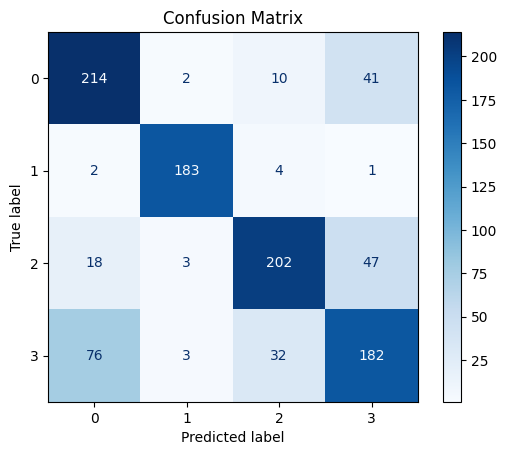

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm_CNN = confusion_matrix(y_true, y_pred_CNN_labels)
disp_CNN = ConfusionMatrixDisplay(confusion_matrix=cm_CNN)
disp_CNN.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

## Test CNN con dataset completo

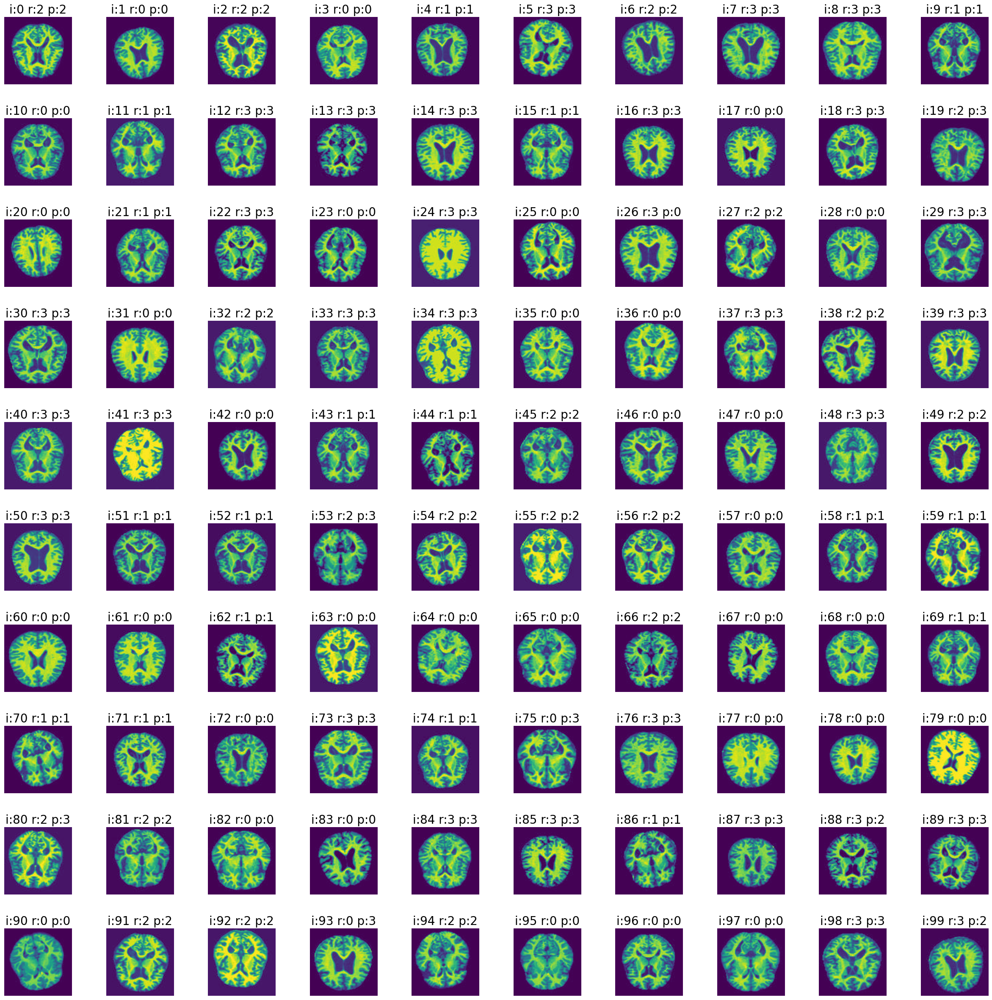

In [ ]:
from sklearn.metrics import f1_score

# with tf.device('/device:GPU:0'):
#   y_pred = model.predict(X)

y_pred = model.predict(X)

y_pred_classes = np.argmax(y_pred, axis=1)
y_pred_classes =to_categorical(y_pred_classes, y.shape[1])
# f1 = f1_score(Y_test, y_pred_classes, average='weighted')

classes = ['0', '1', '2', '3']
x = len(classes)
def list_my_classes(x):
    return [i for i in range(x)]

classes_list = list_my_classes(x)
classes_keys = classes_list
classes_values = classes
tuple_lists = zip(classes_keys, classes_values)
dict_classes = dict(tuple_lists)

rows = 10
cols = 10
fig, axes = plt.subplots(rows, cols, figsize=(30, 30))

for i in range(rows):
    for j in range(cols):
        idx = i * cols + j  # Calculate the image's index in the list
        axes[i, j].imshow(X[idx])
        real_output = dict_classes[np.argmax(y, axis=1)[idx]]
        prediction = dict_classes[np.argmax(y_pred, axis=1)[idx]]  # Ottieni la predizione per l'immagine corrente
        axes[i, j].set_title("i:{} r:{} p:{}".format(idx, real_output, prediction), fontsize=20)  # Aggiungi il titolo desiderato
        axes[i, j].axis('off')  # Rimuovi gli assi

plt.subplots_adjust(wspace=0.5, hspace=0.5)  # Aggiungi spaziatura tra le immagini
#print('Top 100 predictions plot has been generated in:')
#print(directory_model_path +'/'+'PredictionTestPlot.png')
#plt.savefig(directory_model_path +'/'+'PredictionTestPlot.png', bbox_inches='tight')
#plt.close()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 100, 100))
  warnings.warn(msg)


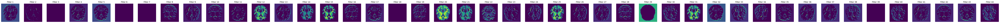

In [ ]:
feature_map_model = models.Model(inputs=model.inputs, outputs=model.layers[0].output)

# Get the feature map for a sample image (e.g., the first image in the test set)
sample_image = np.expand_dims(X_test[1], axis=0)
feature_map = feature_map_model.predict(sample_image)

# Plot the feature map
num_filters = feature_map.shape[-1]
fig, axes = plt.subplots(1, num_filters, figsize=(num_filters * 2, 2))

for i in range(num_filters):
    axes[i].imshow(feature_map[0, :, :, i], cmap='viridis')
    axes[i].set_title(f'Filter {i+1}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Valutazione del modello
# with tf.device('/device:GPU:0'):
#   tot_loss, tot_acc = model.evaluate(X, y)

tot_loss, tot_acc = model.evaluate(X, y)
print(f'Accuracy on reduced dataset (5000): {tot_acc} \nLoss on reduced dataset (5000): {tot_loss}')

160/160 ━━━━━━━━━━━━━━━━━━━━ 112s 704ms/step - accuracy: 0.9491 - loss: 0.2752
Accuracy on reduced dataset (5000): 0.950961172580719 
Loss on reduced dataset (5000): 0.27421027421951294


# Creazione modello troncato

In [ ]:
# Rimuovo gli ultimi due layer della CNN
model_truncated = models.Model(inputs=model.inputs, outputs=model.layers[-3].output)

# Genero l'input della KAN (output della CNN troncata)
# with tf.device('/device:GPU:0'):
#   y_flatten = model_truncated.predict(X)
y_flatten = model_truncated.predict(X)

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(32, 100, 100))
  warnings.warn(msg)


160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(None, 100, 100))
  warnings.warn(msg)


160/160 ━━━━━━━━━━━━━━━━━━━━ 65s 402ms/step


In [ ]:
y_flatten.shape

(5098, 512)

In [ ]:
y.shape

(5098, 4)

In [ ]:
new_X = y_flatten

In [ ]:
new_X.shape

(5098, 512)

In [ ]:
list_varying = list([])
for i in range(len(new_X[0])):
  comp = new_X[0,i]
  if any(new_X[:,i]!=comp):
    list_varying.append(i)
print(list_varying)
print(f"The number of dimension with varying data is {len(list_varying)}/512")

[1, 2, 3, 4, 16, 18, 32, 36, 38, 43, 47, 50, 62, 68, 70, 73, 74, 76, 80, 86, 87, 91, 120, 122, 145, 152, 156, 174, 192, 203, 222, 240, 247, 253, 273, 276, 279, 290, 291, 299, 310, 311, 312, 329, 352, 363, 380, 381, 402, 403, 413, 415, 423, 426, 432, 447, 448, 449, 453, 457, 463, 466, 469, 476, 480, 487, 492, 505]
The number of dimension with varying data is 68/512


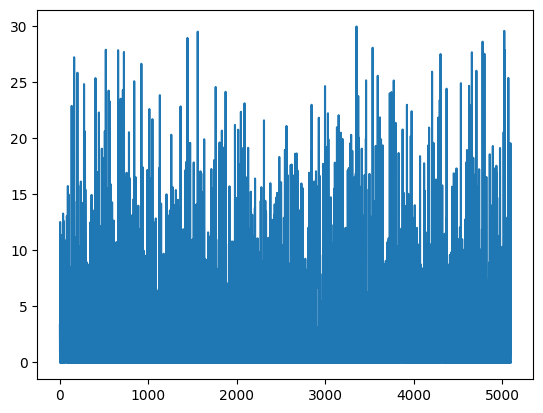

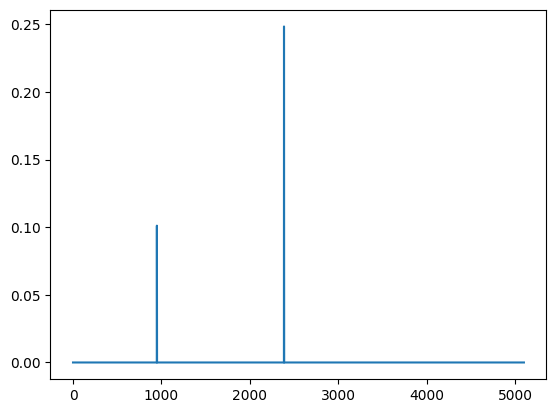

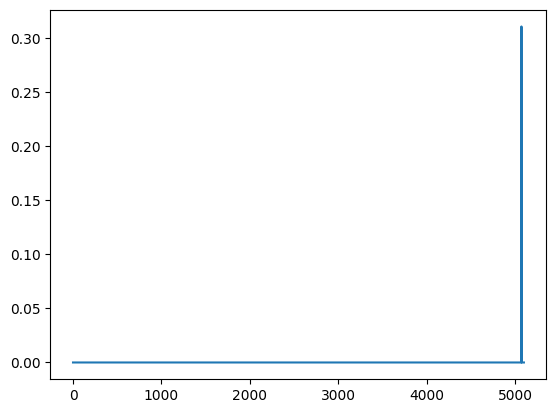

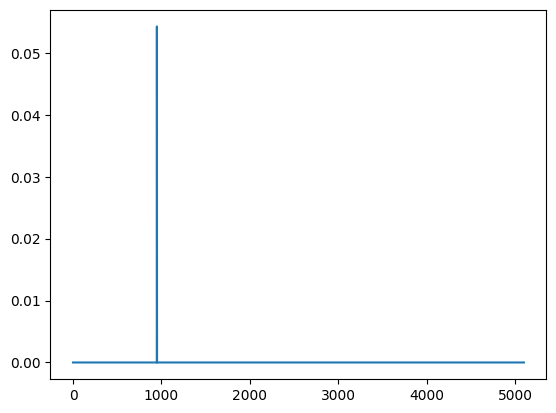

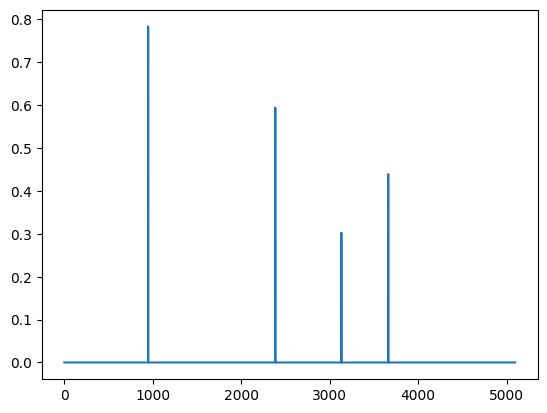

...

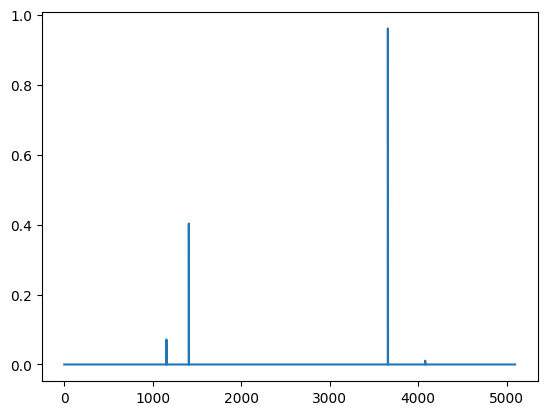

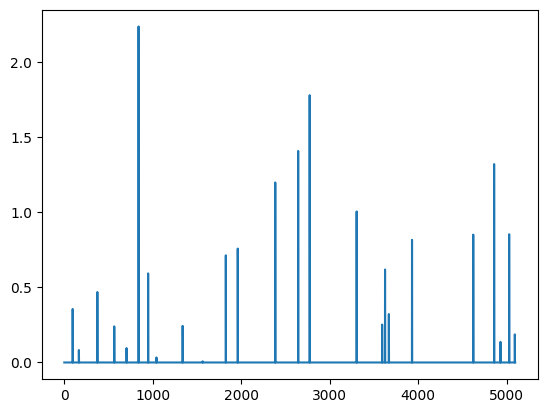

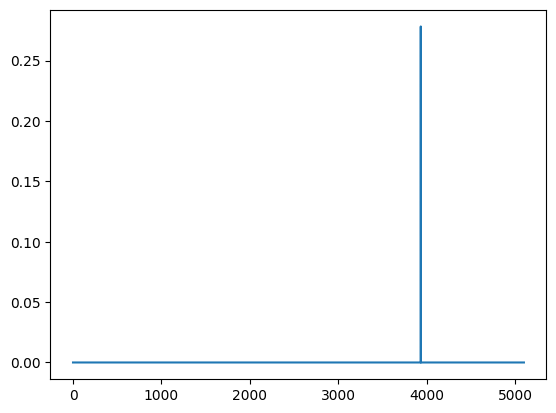

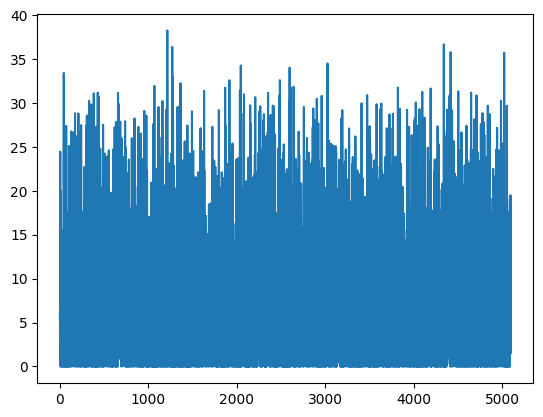

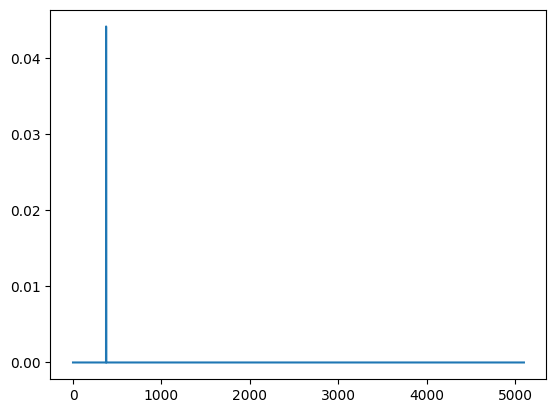

In [ ]:
# Visualize the varying components
new_X = new_X[:,list_varying]
for i in range(len(new_X[0])):
  plt.plot(new_X[:,i])
  plt.show()

In [ ]:
# Save reduced dataset
import pickle

# Define the filename for the pickle file
pickle_filename = 'ALZ_reduced30e_dataset_KAN_onlyVarying.pkl'

# Save X_test and Y_test to the pickle file
with open(pickle_filename, 'wb') as f:
    pickle.dump({'X': new_X, 'Y': y}, f)

print(f"X_reduced_KAN and Y_reduced_KAN saved to {pickle_filename}")

X_reduced_KAN and Y_reduced_KAN saved to ALZ_reduced30e_dataset_KAN_onlyVarying.pkl


In [3]:
# Load dataset

import pickle

# Define the filename for the pickle file
pickle_filename = 'ALZ_reduced30e_dataset_KAN_onlyVarying.pkl'

with open(pickle_filename, 'rb') as f:
    loaded_data = pickle.load(f)
new_X = loaded_data['X']
y = loaded_data['Y']

print("Data loaded successfully.")
print("Loaded X_test shape:", new_X.shape)
print("Loaded Y_test shape:", y.shape)

Data loaded successfully.
Loaded X_test shape: (5098, 68)
Loaded Y_test shape: (5098, 4)


# PCA Output modello troncato

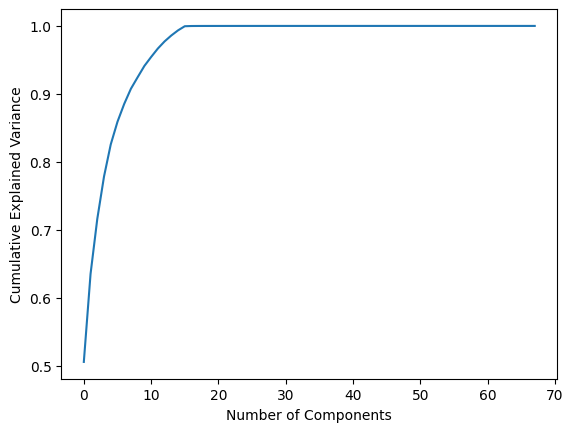

Le prime 14 componenti spiegano il 99.34793090820312% della varianza


In [4]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(new_X)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

# Controlo quante PC occorrono per mantenere il 99% della varianza originale
cum_var_90 = np.cumsum(pca.explained_variance_ratio_)>=0.99
for i,j in enumerate(cum_var_90):
  if j:
    print(f"Le prime {i} componenti spiegano il {np.cumsum(pca.explained_variance_ratio_)[i]*100}% della varianza")
    break

In [5]:
old_new_X = new_X
new_X = pca.transform(new_X)[:,:i]

In [6]:
new_X.shape

(5098, 14)

# Linear regression with backwards elimination

In [7]:
import statsmodels.api as sm

Y_lm = pd.DataFrame(np.argmax(y, axis=1))
X_lm = new_X
X_lm = sm.add_constant(X_lm)
X_lm = pd.DataFrame(X_lm, columns=['const', *[f'PC{i+1}' for i in range(X_lm.shape[1]-1)]])
model_lm = sm.OLS(Y_lm, X_lm)
results = model_lm.fit()

results.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      0   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.600
Method:                 Least Squares   F-statistic:                     546.9
Date:                Sun, 29 Jun 2025   Prob (F-statistic):               0.00
Time:                        10:49:15   Log-Likelihood:                -5673.7
No. Observations:                5098   AIC:                         1.138e+04
Df Residuals:                    5083   BIC:                         1.148e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.4955      0.010    144.792      0.000       1.475       1.516
PC1           -0.0108      0.001    -19.695      0.000      -0.012      -0.010
PC2           -0.0710      0.001    -65.190      0.000      -0.073      -0.069
PC3            0.0132      0.001      9.561      0.000       0.010       0.016
PC4            0.0354      0.002     22.599      0.000       0.032       0.039
PC5           -0.0432      0.002    -23.950      0.000      -0.047      -0.040
PC6           -0.0793      0.002    -36.945      0.000      -0.083      -0.075
PC7           -0.0226      0.002     -9.359      0.000      -0.027      -0.018
PC8            0.0483      0.003     18.458      0.000       0.043       0.053
PC9            0.0094      0.003      3.139      0.002       0.004       0.015
PC10          -0.0183      0.003     -6.021      0.000      -0.024      -0.012
PC11          -0.0027      0.003     -0.803      0.422      -0.009       0.004
PC12          -0.0034      0.004     -0.967      0.334      -0.010       0.003
PC13           0.0057      0.004      1.495      0.135      -0.002       0.013
PC14          -0.0012      0.004     -0.281      0.779      -0.009       0.007
==============================================================================
Omnibus:                       16.401   Durbin-Watson:                   2.025
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               16.493
Skew:                          -0.139   Prob(JB):                     0.000262
Kurtosis:                       3.010   Cond. No.                         18.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [8]:
X_lm.shape

(5098, 15)

In [9]:
import math
list_tvals_to_exclude = [i-1 for i,p in enumerate(results.tvalues) if abs(p) < 1.96]
if list_tvals_to_exclude[0]==-1:
  list_tvals_to_exclude = list_tvals_to_exclude[1:]

while len(list_tvals_to_exclude) > 0:
  t_vals = results.tvalues.drop('const')
  flag = 0
  for k,j in enumerate(results.tvalues):
    if math.isnan(j):
      flag = 1
      break
  if flag:
    t_vals.drop([f"PC{k}"], inplace=True)
  elif len(list_tvals_to_exclude) > 0:
    t_vals.drop([p for p in t_vals.index if abs(t_vals[p]) == abs(t_vals).min()], inplace=True)
  X_lm = X_lm[t_vals.index]
  print(f"New shape of DataFrame is {X_lm.shape}")
  X_lm = sm.add_constant(X_lm)
  results = sm.OLS(Y_lm, X_lm).fit()
  list_tvals_to_exclude = [i for i,p in enumerate(results.tvalues) if abs(p) < 1.96]
  if len(list_tvals_to_exclude) > 0:
    if list_tvals_to_exclude[0]==-1:
      list_tvals_to_exclude = list_tvals_to_exclude[1:]

results.tvalues.drop('const', inplace=True)
X_lm = X_lm[list(t_vals.index)]
print(f"Final number of components is {X_lm.shape[1]}\n\n",results.summary(),"\n\n",X_lm.head())

New shape of DataFrame is (5098, 13)
New shape of DataFrame is (5098, 12)
New shape of DataFrame is (5098, 11)
New shape of DataFrame is (5098, 10)
Final number of components is 10

                             OLS Regression Results                            
Dep. Variable:                      0   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.600
Method:                 Least Squares   F-statistic:                     765.3
Date:                Sun, 29 Jun 2025   Prob (F-statistic):               0.00
Time:                        10:49:22   Log-Likelihood:                -5675.6
No. Observations:                5098   AIC:                         1.137e+04
Df Residuals:                    5087   BIC:                         1.145e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    st

In [10]:
new_X_before_lm = new_X
new_X = X_lm

In [11]:
PCs = list([])
for col in new_X.columns:
  PCs.append(int(col[2:])-1)
var_explained_lm = sum(pca.explained_variance_ratio_[PCs])
print(f"Variance explained by the chosen PCs: {var_explained_lm}")

Variance explained by the chosen PCs: 0.9411682486534119


In [12]:
new_X

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,14.131481,-13.846976,15.172350,-6.775784,9.836170,3.186457,-0.019562,-0.303492,-5.604661,-4.612857
1,13.203304,2.584912,-3.479633,-1.667981,-0.449535,6.027552,1.566828,-1.399290,5.304744,-5.987253
2,-13.350217,-13.331199,5.651316,4.683561,8.122404,1.055750,-2.524214,2.704563,7.803734,-0.470396
3,33.570946,17.530411,-4.222672,3.164409,4.460979,4.933537,-3.241906,-0.110420,3.330051,2.509702
4,-32.506355,10.921268,0.294024,4.970117,6.468878,0.472405,-1.472363,1.454938,-3.544452,-8.179523
...,...,...,...,...,...,...,...,...,...,...
5093,19.142841,19.735765,-5.510237,-15.339373,9.606892,2.979106,11.557929,3.574005,-2.713857,5.271248
5094,27.928307,-8.823112,9.493292,-2.787238,-9.680215,-1.228148,4.468884,-2.327696,-4.705882,-1.391479
5095,-8.794701,-6.064424,-6.741621,-2.713090,3.128574,-1.729653,-6.553949,3.636546,-1.325281,-4.290320
5096,-23.431746,4.764664,1.682142,-5.764987,-8.574433,6.444751,-3.483136,2.699176,0.056181,-1.656223


# Kolmogorov-Arnold Network

In [13]:
torch.set_default_dtype(torch.float64)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

new_X = new_X.values
y_onehot = y


cpu


In [ ]:
# Creazione di una KAN: 3-D input, 4-D output, 10 neuroni nell'hidden layer, spline quadratica (k=2), 2 grid intervals (grid=2).
model_kan = KAN(width=[new_X.shape[1],6,4], grid=2, k=2, seed=42, device=device)

checkpoint directory created: ./model
saving model version 0.0


In [ ]:
X_train_kan, X_test_kan, y_train_kan, y_test_kan = train_test_split(new_X, y_onehot, test_size=0.2, random_state=42)
X_train_kan = torch.tensor(X_train_kan, dtype=torch.float64).to(device)
y_train_kan = torch.tensor(y_train_kan, dtype=torch.float64).to(device)
X_test_kan = torch.tensor(X_test_kan, dtype=torch.float64).to(device)
y_test_kan = torch.tensor(y_test_kan, dtype=torch.float64).to(device)

In [ ]:
dataset = {
    'train_input': X_train_kan,
    'train_label': y_train_kan,
    'test_input': X_test_kan,
    'test_label': y_test_kan
}

## Controlli

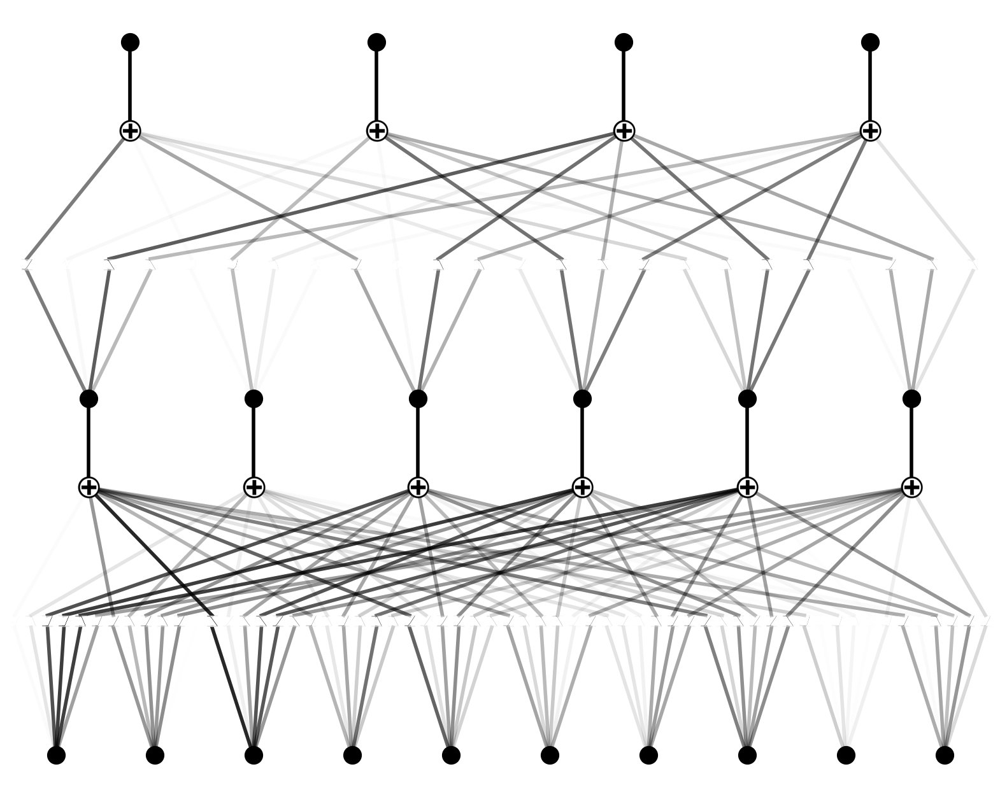

In [ ]:
# Plot KAN inizializzata
model_kan(dataset['train_input'][:10]);
model_kan.plot(scale=2.0)

In [ ]:
# Controllo qualità dei dati - NaN e Inf
assert not torch.isnan(X_train_kan).any(), "X_train contiene NaN"
assert not torch.isinf(X_train_kan).any(), "X_train contiene Inf"
assert not torch.isnan(y_train_kan).any(), "y_train contiene NaN"

In [ ]:
# Controllo qualità dei dati - y onehot
assert y_train_kan.min() >= 0.0 and y_train_kan.max() <= 1.0 # Devono essere tutti 0 o 1
assert torch.allclose(y_train_kan.sum(dim=1), torch.ones(y_train_kan.shape[0], device=device), atol=1e-3) # Ogni riga deve sommare a 1 (una sola classe attiva)

In [ ]:
# Controlo che la KAN non produca errori all'inizializzazione
with torch.no_grad():
    out = model_kan(X_train_kan[:10])
    print(out)  # Verifica: contiene NaN o valori enormi?
    assert torch.isfinite(out).all(), "KAN produce output NaN o Inf già a inizio"

tensor([[ 1.1989,  0.2268, -2.4483, -0.5636],
        [-0.4793, -0.0034, -0.5017, -0.6521],
        [ 2.3737, -0.7141, -2.6746, -0.0345],
        [ 1.2904, -0.7271, -2.0216,  0.2505],
        [-0.5996, -0.3787, -1.7627, -1.5122],
        [ 0.2770,  0.5114, -0.9496, -0.4374],
        [ 1.5148, -0.1175, -1.5379, -0.6774],
        [ 0.6560, -0.4009, -2.2133, -1.5605],
        [ 1.1434,  0.0414, -2.0537, -0.4417],
        [ 1.7230, -1.4411, -2.6538,  0.5695]])


### Scaling

In [ ]:
print("Min:", X_train_kan.min().item(), "Max:", X_train_kan.max().item(), "Mean:", X_train_kan.mean().item(), "Std:", X_train_kan.std().item()) # Il dominio deve essere [-1; 1]

Min: -42.28565979003906 Max: 65.20765686035156 Mean: 0.03499859299011941 Std: 8.160862380415091


In [ ]:
old_df = new_X

In [ ]:
# Riscalo il dominio

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_kan.cpu())
X_test_scaled = scaler.transform(X_test_kan.cpu())

# Explicitly convert to torch.float64
X_train_kan = torch.tensor(X_train_scaled, dtype=torch.float64).to(device)
X_test_kan = torch.tensor(X_test_scaled, dtype=torch.float64).to(device)

# Also ensure the labels are float64 for consistency, although the error was with the input features
y_train_kan = torch.tensor(y_train_kan, dtype=torch.float64).to(device)
y_test_kan = torch.tensor(y_test_kan, dtype=torch.float64).to(device)

# Update the dataset dictionary with the correctly typed tensors
dataset = {
    'train_input': X_train_kan*2-1,
    'train_label': y_train_kan,
    'test_input': X_test_kan*2-1,
    'test_label': y_test_kan
}



/tmp/ipython-input-71-54056057.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_train_kan = torch.tensor(y_train_kan, dtype=torch.float64).to(device)
/tmp/ipython-input-71-54056057.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_test_kan = torch.tensor(y_test_kan, dtype=torch.float64).to(device)


In [ ]:
print("Min:", dataset['train_input'].min().item(), "Max:", dataset['train_input'].max().item(), "Mean:", dataset['train_input'].mean().item(), "Std:", dataset['train_input'].std().item())

Min: -1.0 Max: 1.0 Mean: -0.07350198112792145 Std: 0.3005012048428497


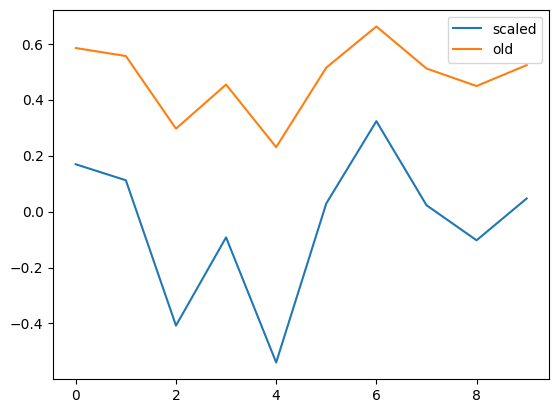

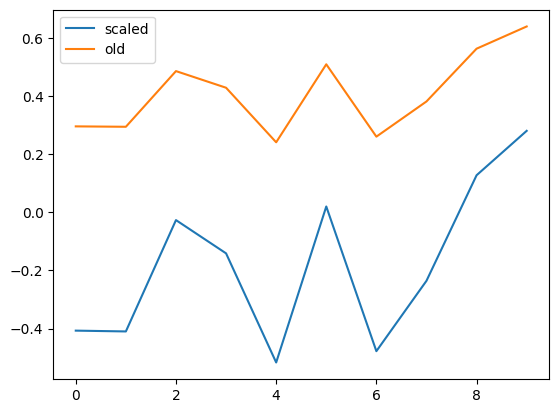

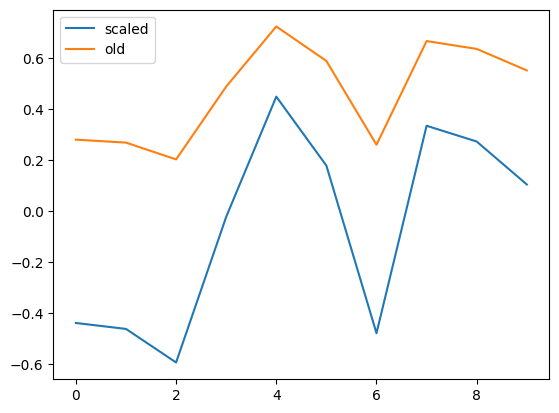

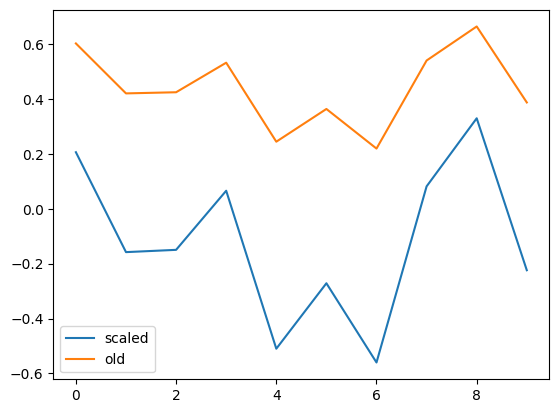

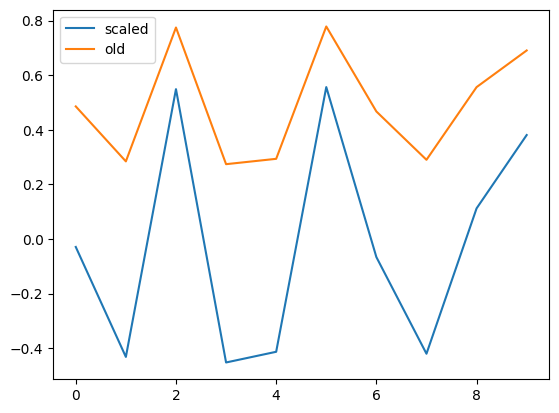

...

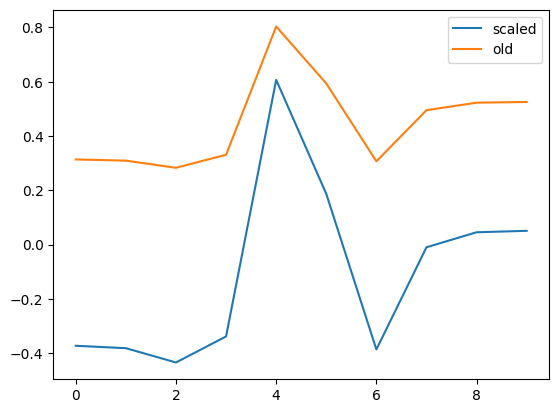

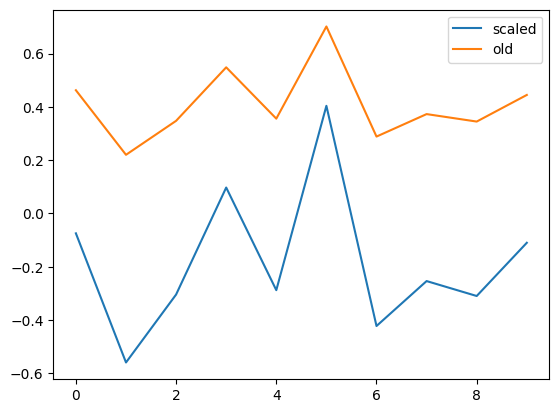

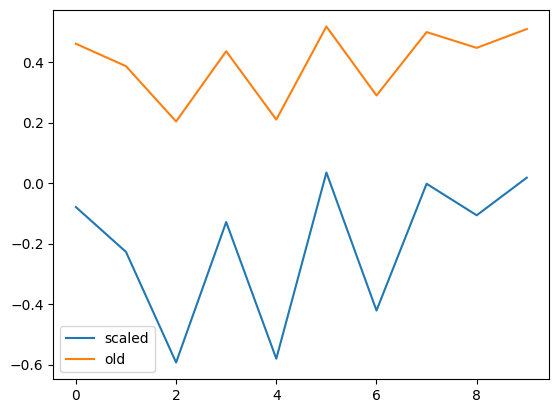

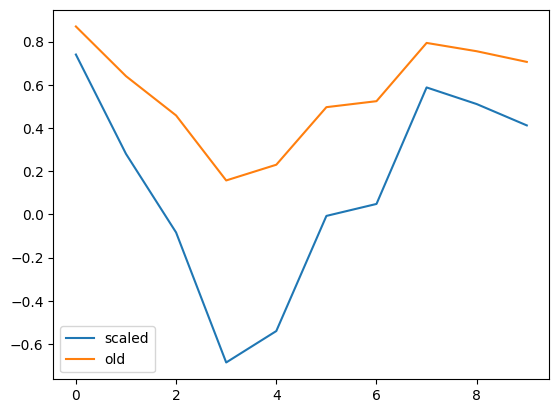

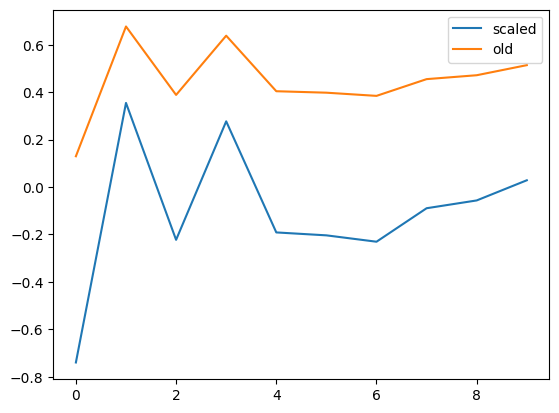

In [ ]:
for i in range(20):
  plt.plot(dataset['train_input'][i], label='scaled')
  plt.plot(X_train_kan[i], label='old')
  plt.legend()
  plt.show()

### Train

| train_loss: 5.06e-01 | test_loss: 5.08e-01 | reg: 1.32e+01 | : 100%|█| 5/5 [00:03<00:00,  1.40it/s


saving model version 0.1


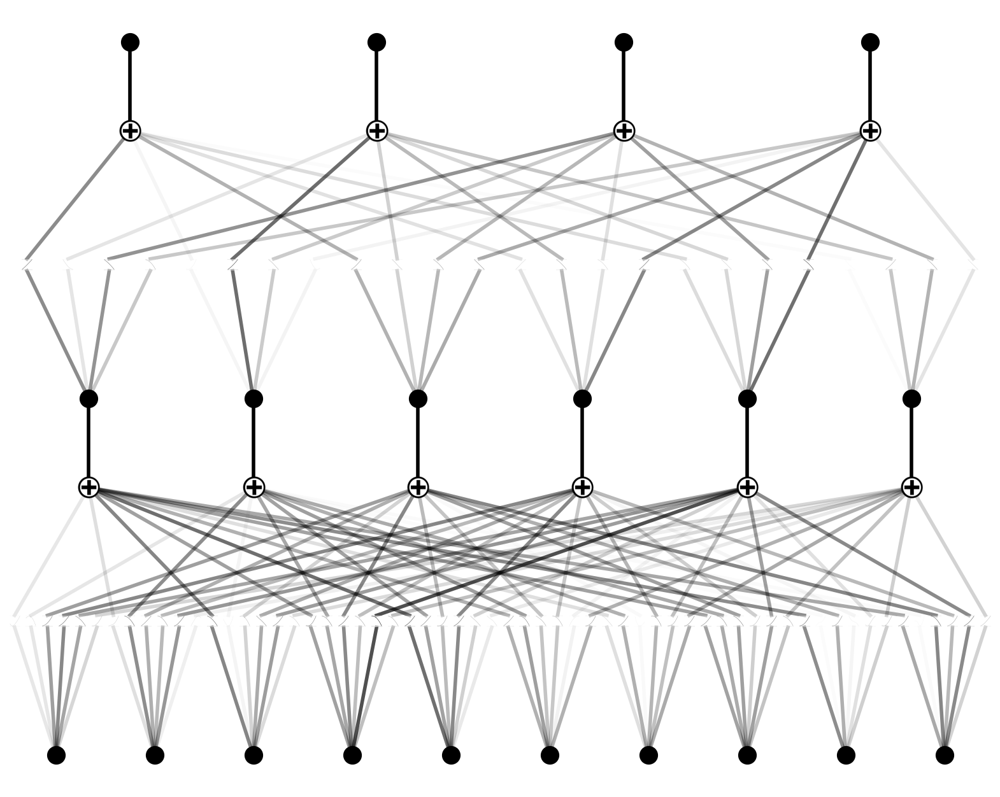

In [ ]:
# train the model to check loss
model_kan.fit(dataset, opt="Adam", steps=5, lr=1e-4, lamb=0.001);
model_kan.plot(scale=2.0)

In [ ]:
with torch.no_grad():
    # Use the PyTorch KAN model (model_kan) with the PyTorch dataset
    y_pred = model_kan(dataset['train_input'][:10])
    print("Model output:", y_pred)
    print("isfinite?", torch.isfinite(y_pred).all()) # Se stampa False c'è un errore

Model output: tensor([[ 0.0331, -0.0623, -0.0232, -0.0406],
        [ 0.0178, -0.0656,  0.0080, -0.0277],
        [ 0.1129, -0.0949, -0.0521, -0.0158],
        [ 0.0639, -0.0947,  0.0093, -0.0214],
        [-0.0221, -0.0423, -0.0115, -0.0443],
        [ 0.0479, -0.0405, -0.0035, -0.0176],
        [ 0.0816, -0.0919,  0.0053, -0.0195],
        [ 0.0396, -0.0930, -0.0014, -0.0493],
        [ 0.0332, -0.0676, -0.0178, -0.0283],
        [ 0.0634, -0.1255, -0.0436, -0.0217]])
isfinite? tensor(True)


In [ ]:
# # In caso prima stampi False

# X_tiny = X_train_kan[:, :2]  # solo 2 feature
# y_tiny = y_train_kan

# model = KAN(width=[2, 10, y_tiny.shape[1]], grid=3, k=2, seed=42, device=device)

# with torch.no_grad():
#     out = model(X_tiny[:10])
#     print(torch.isfinite(out).all())  # DEVE stampare True. In questo caso il problema è di dimensionalità troppo alta dati grid e k

checkpoint directory created: ./model
saving model version 0.0
tensor(True, device='cuda:0')


In [ ]:
# # Effettua PCA e crea nuovo modello

# pca = PCA(n_components=3) # Keep 10 components as a starting point

# # Apply PCA to the scaled numpy arrays directly
# X_train_pca = pca.fit_transform(X_train_scaled)
# X_test_pca = pca.transform(X_test_scaled)

# # Check and filter for non-finite values in the NumPy arrays AFTER PCA
# # before converting them to PyTorch tensors and moving to the device.
# # This might catch the problematic values before the CUDA operation.
# if not np.isfinite(X_train_pca).all():
#     print("Warning: Non-finite values found in X_train_pca after PCA. Removing corresponding samples.")
#     finite_mask_train = np.isfinite(X_train_pca).all(axis=1)
#     X_train_pca = X_train_pca[finite_mask_train]
#     y_train_k = y_train_kan[finite_mask_train] # Filter corresponding labels
#     print(f"Removed {len(finite_mask_train) - np.sum(finite_mask_train)} samples from training data.")

# if not np.isfinite(X_test_pca).all():
#     print("Warning: Non-finite values found in X_test_pca after PCA. Removing corresponding samples.")
#     finite_mask_test = np.isfinite(X_test_pca).all(axis=1)
#     X_test_pca = X_test_pca[finite_mask_test]
#     y_test_k = y_test_kan[finite_mask_test] # Filter corresponding labels
#     print(f"Removed {len(finite_mask_test) - np.sum(finite_mask_test)} samples from test data.")


# # Convert the filtered NumPy arrays to tensors and move them to the device
# X_train_kan = torch.tensor(X_train_pca, dtype=torch.float64).to(device)
# X_test_kan = torch.tensor(X_test_pca, dtype=torch.float64).to(device)

# # Ensure labels are on the correct device and type
# # Ensure y_train_k and y_test_k are still numpy arrays if filtering occurred above
# y_train_kan = torch.tensor(y_train_kan, dtype=torch.float64).to(device)
# y_test_kan = torch.tensor(y_test_kan, dtype=torch.float64).to(device)


# # Scale the input features to [-1, 1] range as suggested in KAN examples
# dataset = {
#     'train_input': X_train_kan * 2 - 1,
#     'train_label': y_train_kan,
#     'test_input': X_test_kan * 2 - 1,
#     'test_label': y_test_kan
# }

# # Re-initialize the KAN model with the correct input dimension after PCA
# # The width should be [number of PCA components, hidden_neurons, output_classes]
# model_kan_new = KAN(width=[X_train_kan.shape[1], 10, 4], grid=2, k=2, seed=42, device=device)

# # Now try fitting the model and check loss
# model_kan_new.fit(dataset, opt="Adam", steps=5, lr=1e-4, lamb=0.001)

/tmp/ipython-input-61-1654215219.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_train_kan = torch.tensor(y_train_kan, dtype=torch.float64).to(device)
/tmp/ipython-input-61-1654215219.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  y_test_kan = torch.tensor(y_test_kan, dtype=torch.float64).to(device)


checkpoint directory created: ./model
saving model version 0.0


| train_loss: 5.05e-01 | test_loss: 5.04e-01 | reg: 6.31e+00 | : 100%|█| 5/5 [00:00<00:00, 13.35it/s

saving model version 0.1


{'train_loss': [array(0.50601617),
  array(0.50573223),
  array(0.5054488),
  array(0.50516592),
  array(0.5048836)],
 'test_loss': [array(0.50523755),
  array(0.50495353),
  array(0.50467003),
  array(0.50438706),
  array(0.50410465)],
 'reg': [array(6.32049254),
  array(6.31838901),
  array(6.31628127),
  array(6.31416983),
  array(6.31205567)]}

In [ ]:
# Check che stamp True
model_kan_new = model_kan.copy()
with torch.no_grad():
    out = model_kan_new(X_train_kan[:10])
    print("Check output:", torch.isfinite(out).all())


Check output: tensor(True)


| train_loss: 4.97e-01 | test_loss: 4.99e-01 | reg: 1.31e+01 | : 100%|█| 45/45 [00:04<00:00, 10.13it


saving model version 1.2


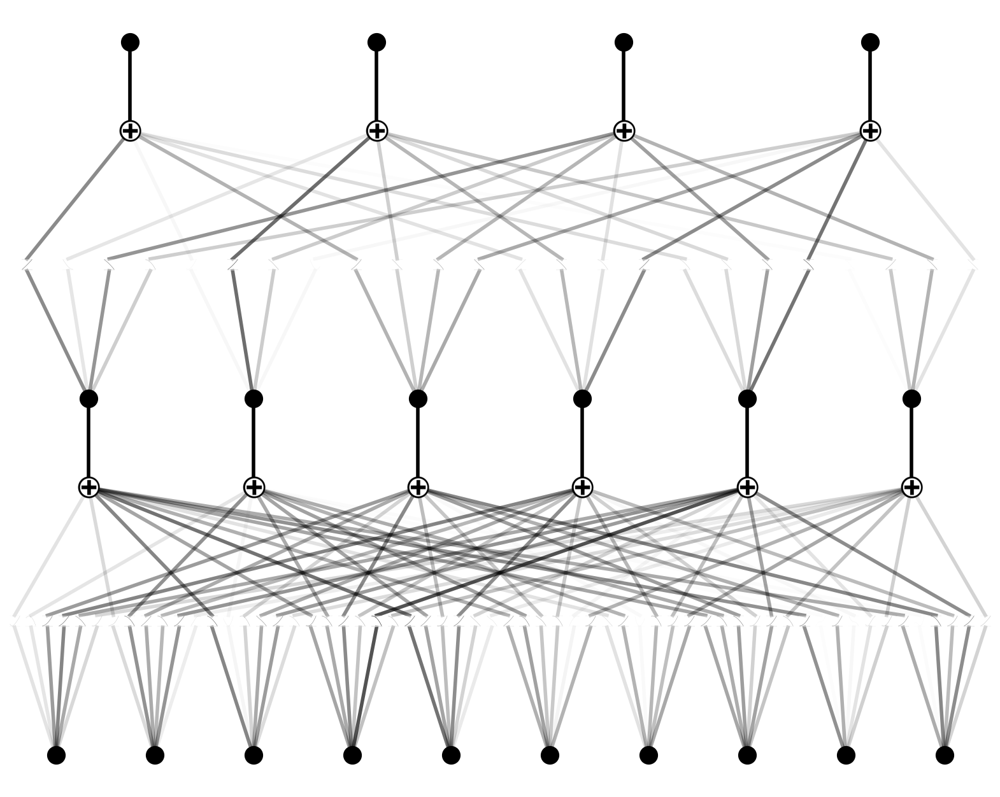

In [ ]:
# train the model
model_kan_new.fit(dataset, opt="Adam", steps=45, lr=1e-4, lamb=0.001);
model_kan_new.plot(scale=2.0)

| train_loss: 4.62e-01 | test_loss: 4.63e-01 | reg: 2.08e+02 | : 100%|█| 50/50 [00:03<00:00, 13.38it


saving model version 1.3


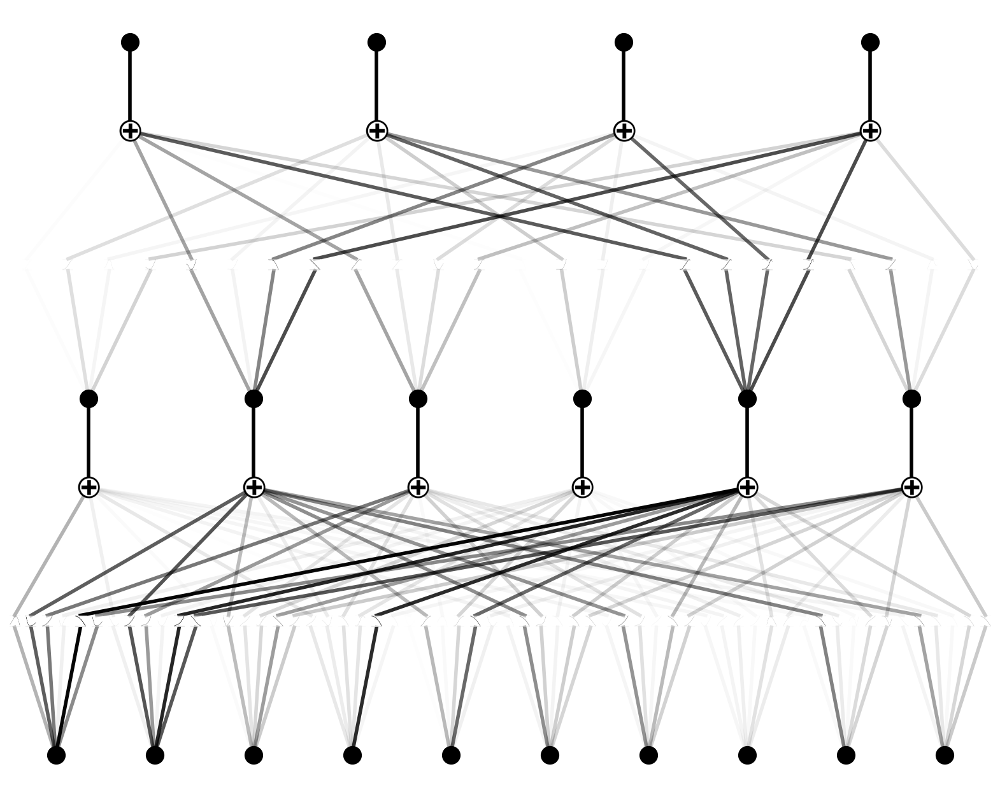

In [ ]:
model_kan_new.fit(dataset, opt="Adam", steps=50);
model_kan_new.plot(scale=2.0)

| train_loss: 4.39e-01 | test_loss: 4.49e-01 | reg: 2.05e+02 | : 100%|█| 100/100 [00:09<00:00, 10.16


saving model version 1.4


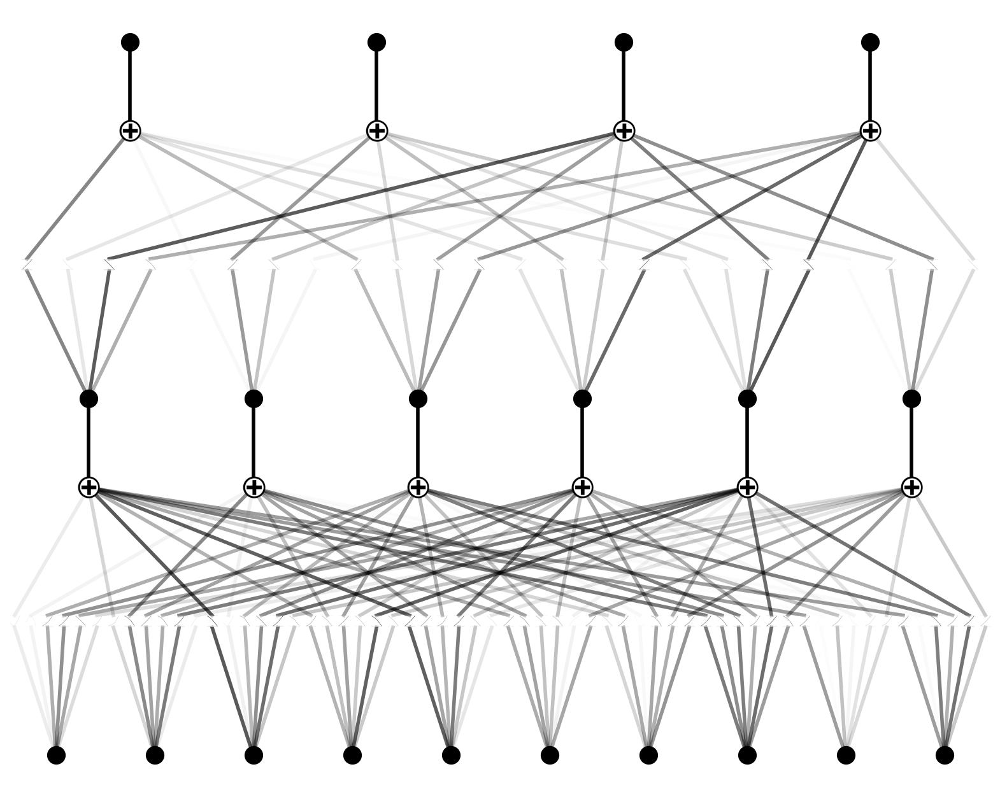

In [ ]:
model_kan_new.fit(dataset, opt="Adam", steps=100, lr=1e-4, lamb=0.001);
model_kan.plot(scale=2.0)

### Formula

In [ ]:
from kan.utils import ex_round
model_kan_new.auto_symbolic()
formula = ex_round(model_kan_new.symbolic_formula()[0][0],4)
formula

fixing (0,0,0) with sin, r2=0.9997306933663157, c=2
fixing (0,0,1) with exp, r2=0.997615540191057, c=2
fixing (0,0,2) with 1/x, r2=0.9973552108320771, c=2
fixing (0,0,3) with sin, r2=0.9992324182520747, c=2
fixing (0,0,4) with 0, r2=0.0, c=0
fixing (0,0,5) with 0, r2=0.0, c=0
fixing (0,1,0) with 0, r2=0.0, c=0
fixing (0,1,1) with 0, r2=0.0, c=0
fixing (0,1,2) with sin, r2=0.9969044224287716, c=2
fixing (0,1,3) with sin, r2=0.9965682230951574, c=2
fixing (0,1,4) with sin, r2=0.9990138779555088, c=2
fixing (0,1,5) with sin, r2=0.9986808547424799, c=2
fixing (0,2,0) with 1/x^2, r2=0.9997487978522316, c=2
fixing (0,2,1) with cos, r2=0.9986822255659149, c=2
fixing (0,2,2) with x^2, r2=0.9983411300914268, c=2
fixing (0,2,3) with cos, r2=0.9980973374056203, c=2
fixing (0,2,4) with cos, r2=0.9999971747132913, c=2
fixing (0,2,5) with cos, r2=0.9999996270021096, c=2
fixing (0,3,0) with sin, r2=0.9998561580234147, c=2
fixing (0,3,1) with sin, r2=0.9997603476909407, c=2
fixing (0,3,2) with sin, r2

-0.0798*exp(-0.1894*sin(2.1773*x_2 + 6.3942) + 0.3886*sin(1.4737*x_4 - 2.8145) + 0.0955*sin(1.0865*x_5 + 1.1839) - 1.0275*cos(0.4142*x_3 - 4.399) + 0.029*cos(1.8567*x_8 - 5.3897) + 0.3757*tanh(0.8475*x_9 - 1.2162)) - 0.0439

In [ ]:
# how accurate is this formula?
def acc(formula, X, y):
    batch = X.shape[0]
    correct = 0
    for i in range(batch):
        correct += np.round(np.array(formula.subs('x_1', X[i,0])).astype(np.float64)) == y[i]
    return correct/batch

print('train acc of the formula:', acc(formula, dataset['train_input'], dataset['train_label']))
print('test acc of the formula:', acc(formula, dataset['test_input'], dataset['test_label']))

TypeError: Cannot convert expression to float

In [ ]:
def train_acc():
    return torch.mean((torch.round(model_kan_new(dataset['train_input'])[:]) == dataset['train_label'][:]).type(torch.float64))

def test_acc():
    return torch.mean((torch.round(model_kan_new(dataset['test_input'])[:]) == dataset['test_label'][:]).type(torch.float64))

results = model_kan_new.fit(dataset, opt="LBFGS", steps=50, metrics=(train_acc, test_acc));
results['train_acc'][-1], results['test_acc'][-1]

| train_loss: nan | test_loss: nan | reg: 0.00e+00 | :  20%|█▌      | 10/50 [00:32<02:09,  3.25s/it]

lstsq failed


UnboundLocalError: cannot access local variable 'coef' where it is not associated with a value

In [ ]:
formula = ex_round(model_kan_new.symbolic_formula()[0][0],4)
formula

0

### Test

In [ ]:
model_kan_new.eval()  # modalità valutazione

with torch.no_grad():
    y_pred_kan_new0 = model_kan_new(dataset['test_input'])

y_true = torch.argmax(y_test_kan, dim=1)

y_pred_kan_labels0 = torch.argmax(y_pred_kan_new0, dim=1)

accuracy0 = (y_pred_kan_labels0 == y_true).float().mean()
print("Test Accuracy:", accuracy0.item())

Test Accuracy: 0.4019607901573181


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

y_true_np0 = y_true.cpu().numpy()
y_pred_np0 = y_pred_kan_labels0.cpu().numpy()

print(confusion_matrix(y_true_np0, y_pred_np0))
print(classification_report(y_true_np0, y_pred_np0))


[[122  11  74  60]
 [ 55  28 107   0]
 [ 33  25 182  30]
 [ 60  13 142  78]]
              precision    recall  f1-score   support

           0       0.45      0.46      0.45       267
           1       0.36      0.15      0.21       190
           2       0.36      0.67      0.47       270
           3       0.46      0.27      0.34       293

    accuracy                           0.40      1020
   macro avg       0.41      0.39      0.37      1020
weighted avg       0.41      0.40      0.38      1020



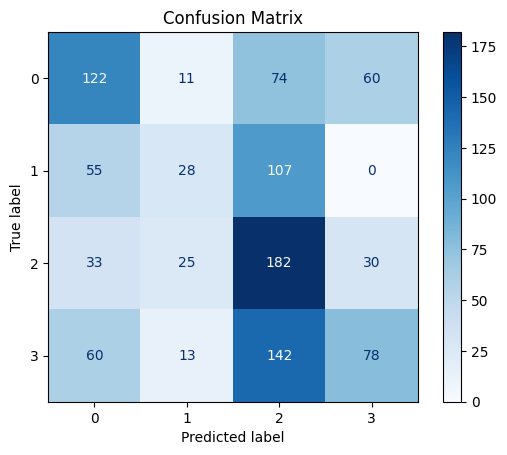

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm0 = confusion_matrix(y_true_np0, y_pred_np0)
disp0 = ConfusionMatrixDisplay(confusion_matrix=cm0)
disp0.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()


## Fit with 300 more steps and Test KAN

| train_loss: 1.52e-01 | test_loss: 3.10e-01 | reg: 6.15e+02 | : 100%|█| 300/300 [00:17<00:00, 16.93


saving model version 1.5


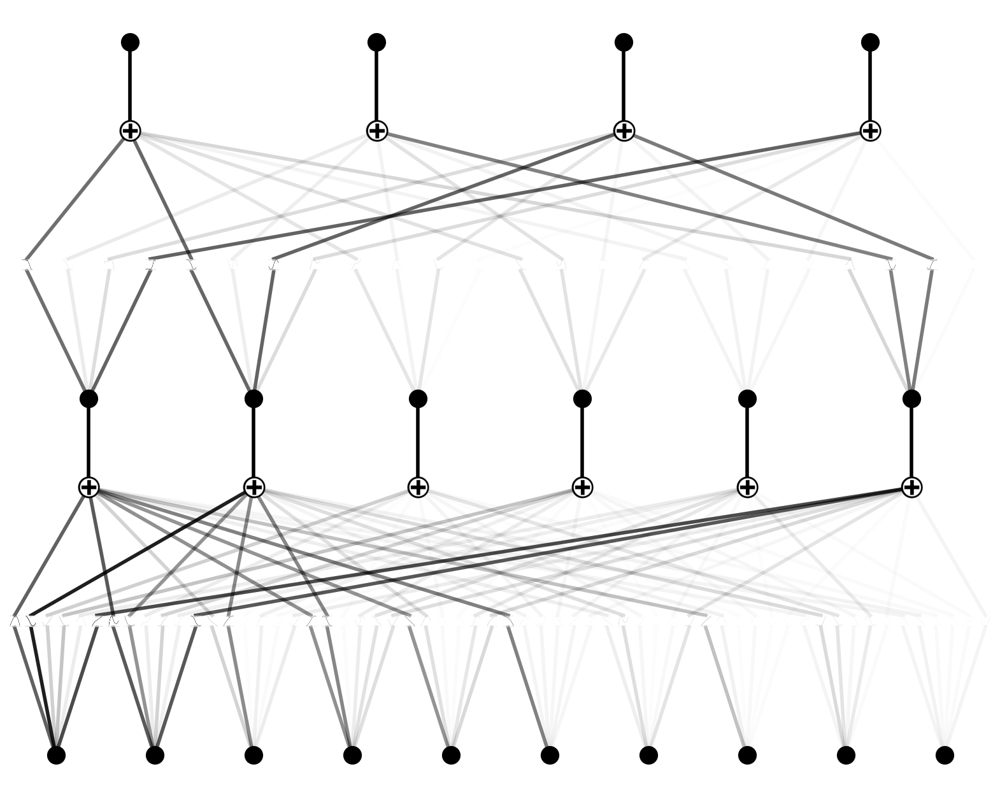

In [ ]:
model_kan_new.fit(dataset, opt="Adam", steps=300);
model_kan_new.plot(scale=2.0)

In [ ]:
model_kan_new.eval()  # modalità valutazione

with torch.no_grad():
    y_pred_kan = model_kan_new(dataset['test_input'])

y_true = torch.argmax(y_test_kan, dim=1)

y_pred_kan_labels = torch.argmax(y_pred_kan, dim=1)

accuracy = (y_pred_kan_labels == y_true).float().mean()
print("Test Accuracy:", accuracy.item())

Test Accuracy: 0.7607843279838562


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

y_true_np = y_true.cpu().numpy()
y_pred_np = y_pred_kan_labels.cpu().numpy()

print(confusion_matrix(y_true_np, y_pred_np))
print(classification_report(y_true_np, y_pred_np))


[[175   4  25  63]
 [  1 183   5   1]
 [  9   3 218  40]
 [ 47   4  42 200]]
              precision    recall  f1-score   support

           0       0.75      0.66      0.70       267
           1       0.94      0.96      0.95       190
           2       0.75      0.81      0.78       270
           3       0.66      0.68      0.67       293

    accuracy                           0.76      1020
   macro avg       0.78      0.78      0.78      1020
weighted avg       0.76      0.76      0.76      1020



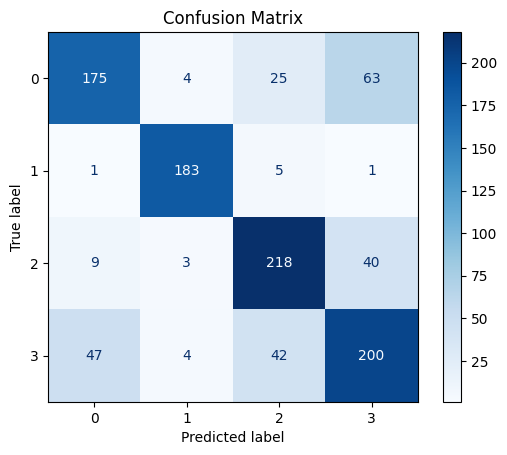

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true_np, y_pred_np)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()


saving model version 2.8


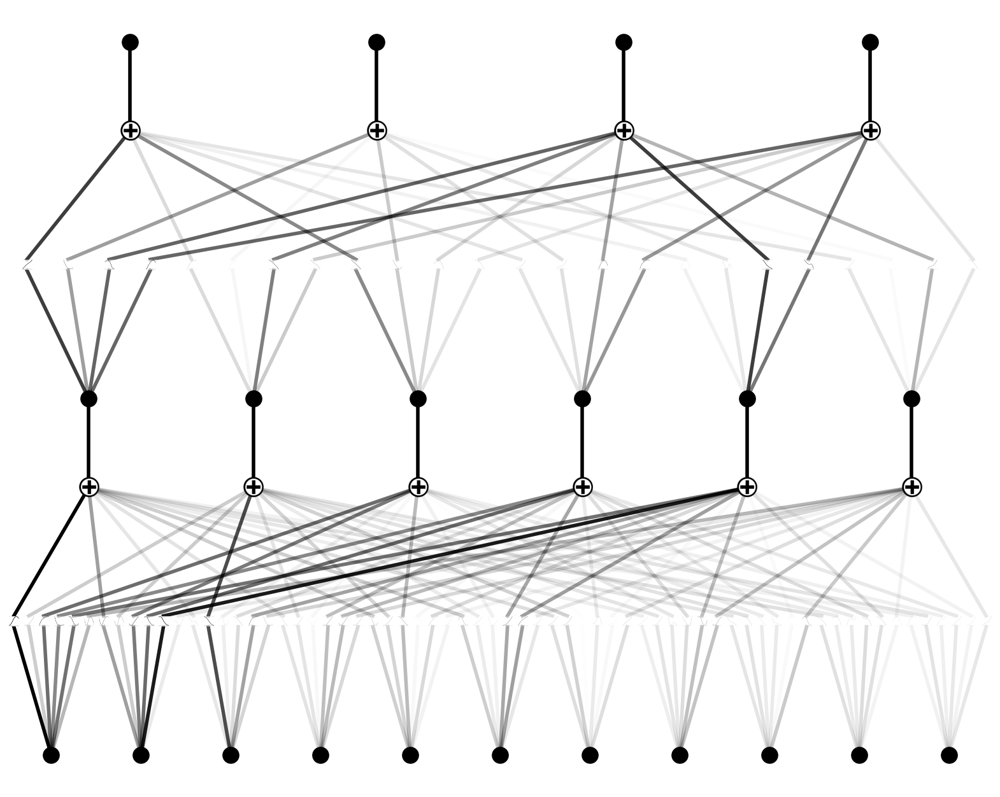

In [ ]:
model_kan2 = model_kan_new.copy()
model_kan2.prune()
model_kan2.plot(scale=2.0)

### Altri 500 step nel modello iniziale (1000 totali)

| train_loss: 1.38e-01 | test_loss: 2.95e-01 | reg: 1.24e+03 | : 100%|█| 500/500 [00:31<00:00, 15.67


saving model version 1.6


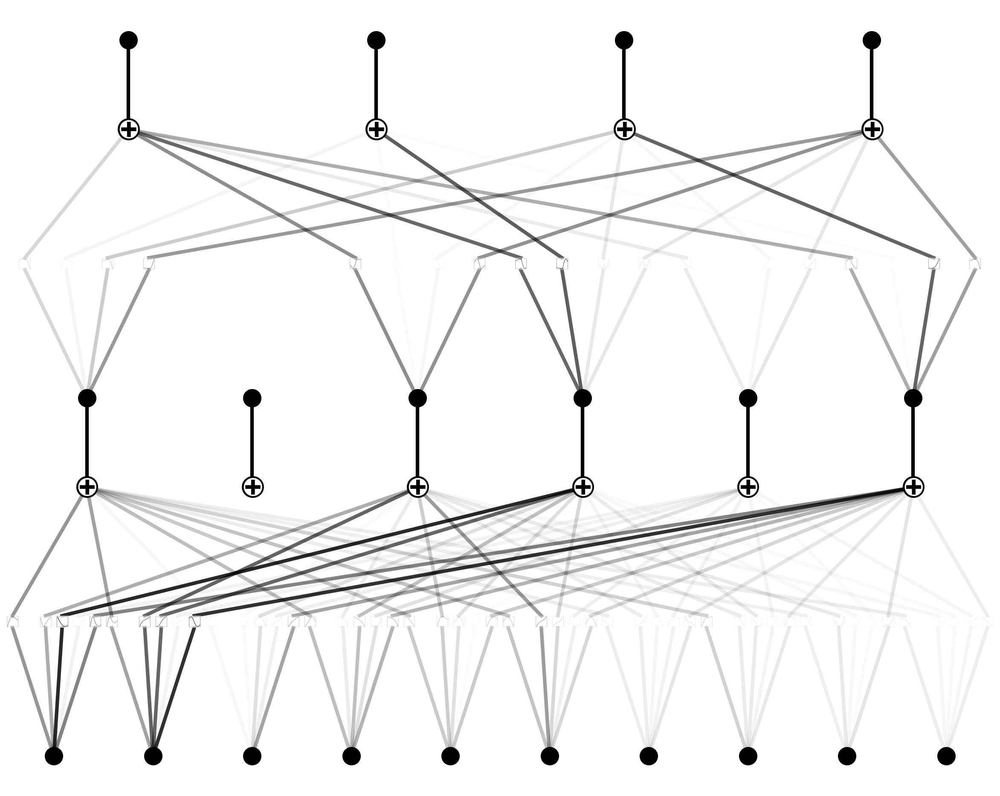

In [ ]:
model_kan_new.fit(dataset, opt="Adam", steps=500);
model_kan_new.plot(scale=3.0)

In [ ]:
model_kan_new.eval()  # modalità valutazione

with torch.no_grad():
    y_pred_kan_new2 = model_kan_new(dataset['test_input'])

y_true = torch.argmax(y_test_kan, dim=1)

y_pred_kan_labels2 = torch.argmax(y_pred_kan_new2, dim=1)

accuracy2 = (y_pred_kan_labels2 == y_true).float().mean()
print("Test Accuracy:", accuracy2.item())

Test Accuracy: 0.7637255191802979


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

y_true_np2 = y_true.cpu().numpy()
y_pred_np2 = y_pred_kan_labels2.cpu().numpy()

print(confusion_matrix(y_true_np2, y_pred_np2))
print(classification_report(y_true_np2, y_pred_np2))


[[197   1  17  52]
 [  3 181   5   1]
 [ 14   4 214  38]
 [ 63   4  39 187]]
              precision    recall  f1-score   support

           0       0.71      0.74      0.72       267
           1       0.95      0.95      0.95       190
           2       0.78      0.79      0.79       270
           3       0.67      0.64      0.65       293

    accuracy                           0.76      1020
   macro avg       0.78      0.78      0.78      1020
weighted avg       0.76      0.76      0.76      1020



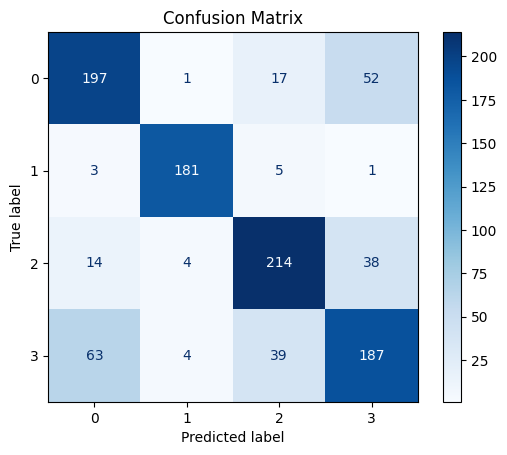

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm2 = confusion_matrix(y_true_np2, y_pred_np2)
disp2 = ConfusionMatrixDisplay(confusion_matrix=cm2)
disp2.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()


### Altri 500 step nel modello pruned

| train_loss: 3.30e-01 | test_loss: 3.45e-01 | reg: 6.52e+02 | : 100%|█| 500/500 [01:04<00:00,  7.72


saving model version 2.8


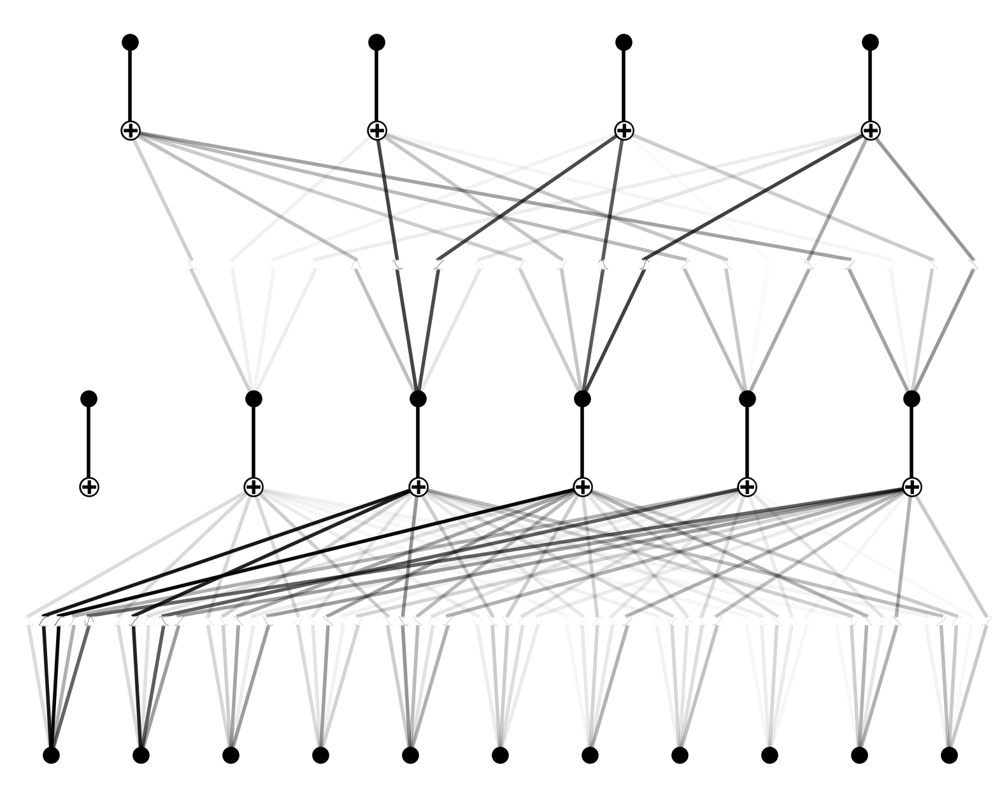

In [ ]:
model_kan2.fit(dataset, opt="Adam", steps=500);
model_kan2.plot(scale=2.0)

In [ ]:
model_kan2.eval()  # modalità valutazione

with torch.no_grad():
    y_pred_kan_pruned = model_kan2(dataset['test_input'])

y_true = torch.argmax(y_test_kan, dim=1)

y_pred_kan_pruned_labels = torch.argmax(y_pred_kan_pruned, dim=1)

accuracy3 = (y_pred_kan_pruned_labels == y_true).float().mean()
print("Test Accuracy:", accuracy3.item())

Test Accuracy: 0.6411764621734619


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

y_true_np_pruned = y_true.cpu().numpy()
y_pred_np_pruned = y_pred_kan_pruned_labels.cpu().numpy()

print(confusion_matrix(y_true_np_pruned, y_pred_np_pruned))
print(classification_report(y_true_np_pruned, y_pred_np_pruned))


[[191   7  41  28]
 [  0 182   7   1]
 [ 18   8 188  56]
 [103  10  87  93]]
              precision    recall  f1-score   support

           0       0.61      0.72      0.66       267
           1       0.88      0.96      0.92       190
           2       0.58      0.70      0.63       270
           3       0.52      0.32      0.39       293

    accuracy                           0.64      1020
   macro avg       0.65      0.67      0.65      1020
weighted avg       0.63      0.64      0.62      1020



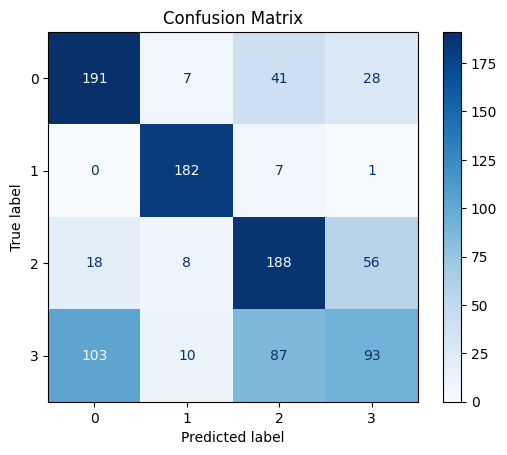

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm3 = confusion_matrix(y_true_np_pruned, y_pred_np_pruned)
disp3 = ConfusionMatrixDisplay(confusion_matrix=cm3)
disp3.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()


## Altri 1000 steps (2000 totali)

| train_loss: 1.08e-01 | test_loss: 2.95e-01 | reg: 2.25e+03 | : 100%|█| 1000/1000 [01:03<00:00, 15.


saving model version 1.7


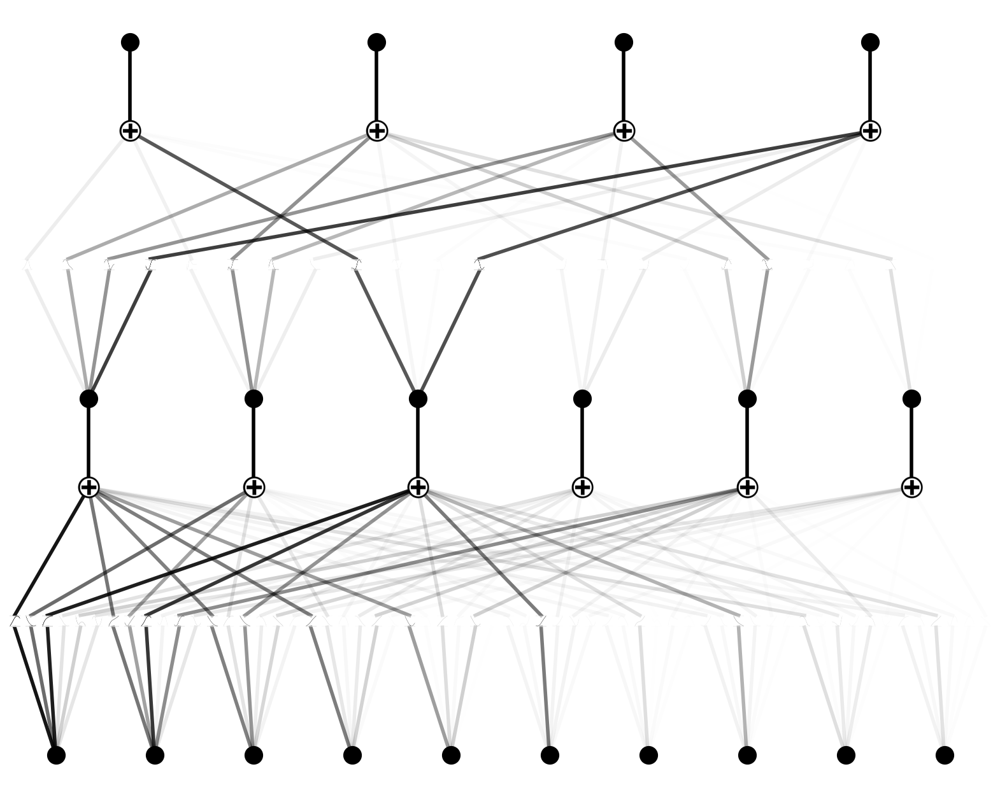

In [ ]:
model_kan_new.fit(dataset, opt="Adam", steps=1000);
model_kan_new.plot(scale=2.0)

In [ ]:
model_kan_new.eval()  # modalità valutazione

with torch.no_grad():
    y_pred_kan_new4 = model_kan_new(dataset['test_input'])

y_true = torch.argmax(y_test_kan, dim=1)

y_pred_kan_labels4 = torch.argmax(y_pred_kan_new4, dim=1)

accuracy4 = (y_pred_kan_labels4 == y_true).float().mean()
print("Test Accuracy:", accuracy4.item())

Test Accuracy: 0.7686274647712708


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

y_true_np4 = y_true.cpu().numpy()
y_pred_np4 = y_pred_kan_labels4.cpu().numpy()

print(confusion_matrix(y_true_np4, y_pred_np4))
print(classification_report(y_true_np4, y_pred_np4))


[[188   3  20  56]
 [  1 182   5   2]
 [  9   4 223  34]
 [ 59   4  39 191]]
              precision    recall  f1-score   support

           0       0.73      0.70      0.72       267
           1       0.94      0.96      0.95       190
           2       0.78      0.83      0.80       270
           3       0.67      0.65      0.66       293

    accuracy                           0.77      1020
   macro avg       0.78      0.78      0.78      1020
weighted avg       0.77      0.77      0.77      1020



In [ ]:
# Risultati della CNN

# [[214   2  10  41]
#  [  2 183   4   1]
#  [ 18   3 202  47]
#  [ 76   3  32 182]]
#               precision    recall  f1-score   support

#            0       0.69      0.80      0.74       267
#            1       0.96      0.96      0.96       190
#            2       0.81      0.75      0.78       270
#            3       0.67      0.62      0.65       293

#     accuracy                           0.77      1020
#    macro avg       0.78      0.78      0.78      1020
# weighted avg       0.77      0.77      0.76      1020

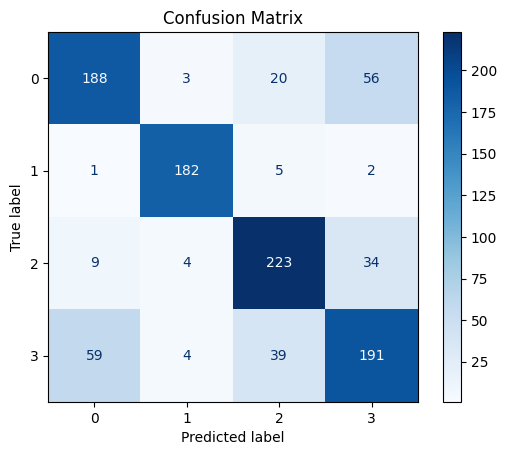

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm4 = confusion_matrix(y_true_np4, y_pred_np4)
disp4 = ConfusionMatrixDisplay(confusion_matrix=cm4)
disp4.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()


In [ ]:
# data_log_transformed = np.log(1+dataset['train_input']+1e-10)
# print("Min:", data_log_transformed.min().item(), "Max:", data_log_transformed.max().item(), "Mean:", data_log_transformed.mean().item(), "Std:", data_log_transformed.std().item())
# sum(dataset['train_input'][:,0]>-1)

Min: -23.025850929940457 Max: 0.6931471806099453 Mean: -23.020105033843368 Std: 0.366953589511408


/tmp/ipython-input-68-2675272632.py:1: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  data_log_transformed = np.log(1+dataset['train_input']+1e-10)


tensor(0)

## Altri 1000 steps (3000 totali)

| train_loss: 2.16e-01 | test_loss: 3.55e-01 | reg: 1.97e+03 | : 100%|█| 1000/1000 [01:04<00:00, 15.


saving model version 1.8


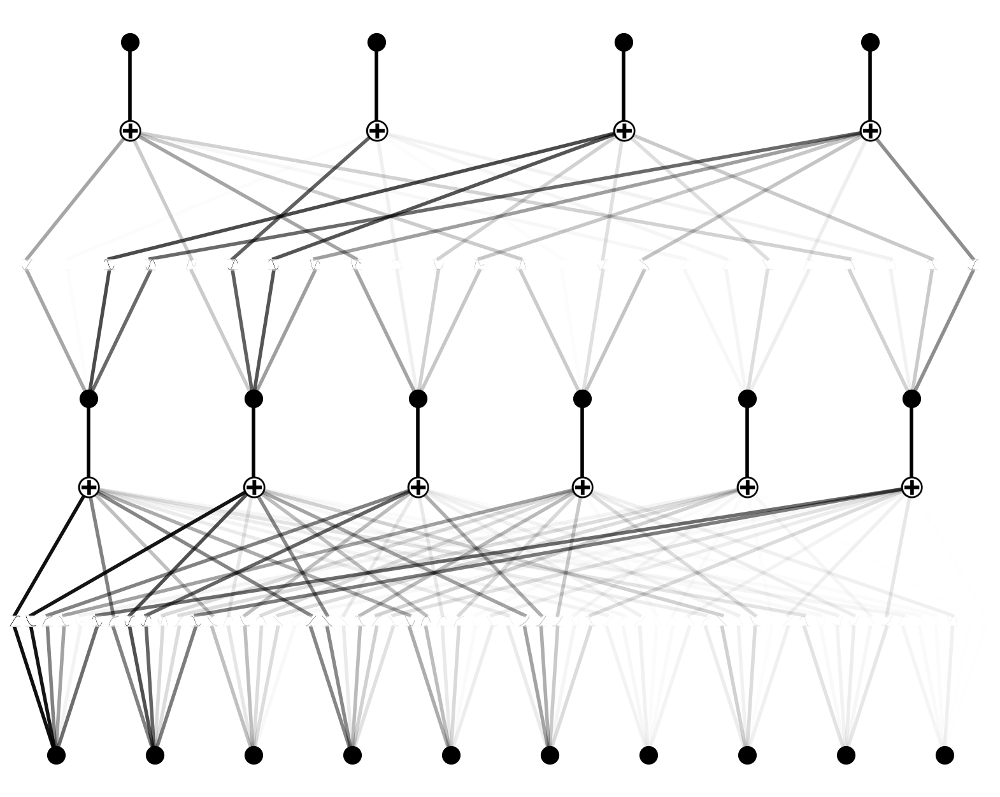

In [ ]:
model_kan_new.fit(dataset, opt="Adam", steps=1000);
model_kan_new.plot(scale=2.0)

In [ ]:
model_kan_new.eval()  # modalità valutazione

with torch.no_grad():
    y_pred_kan_new4 = model_kan_new(dataset['test_input'])

y_true = torch.argmax(y_test_kan, dim=1)

y_pred_kan_labels4 = torch.argmax(y_pred_kan_new4, dim=1)

accuracy4 = (y_pred_kan_labels4 == y_true).float().mean()
print("Test Accuracy:", accuracy4.item())

Test Accuracy: 0.7568627595901489


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

y_true_np4 = y_true.cpu().numpy()
y_pred_np4 = y_pred_kan_labels4.cpu().numpy()

print(confusion_matrix(y_true_np4, y_pred_np4))
print(classification_report(y_true_np4, y_pred_np4))


[[161   4  22  80]
 [  1 183   5   1]
 [  4   3 217  46]
 [ 39   5  38 211]]
              precision    recall  f1-score   support

           0       0.79      0.60      0.68       267
           1       0.94      0.96      0.95       190
           2       0.77      0.80      0.79       270
           3       0.62      0.72      0.67       293

    accuracy                           0.76      1020
   macro avg       0.78      0.77      0.77      1020
weighted avg       0.76      0.76      0.76      1020



In [ ]:
# Risultati della CNN

# [[214   2  10  41]
#  [  2 183   4   1]
#  [ 18   3 202  47]
#  [ 76   3  32 182]]
#               precision    recall  f1-score   support

#            0       0.69      0.80      0.74       267
#            1       0.96      0.96      0.96       190
#            2       0.81      0.75      0.78       270
#            3       0.67      0.62      0.65       293

#     accuracy                           0.77      1020
#    macro avg       0.78      0.78      0.78      1020
# weighted avg       0.77      0.77      0.76      1020

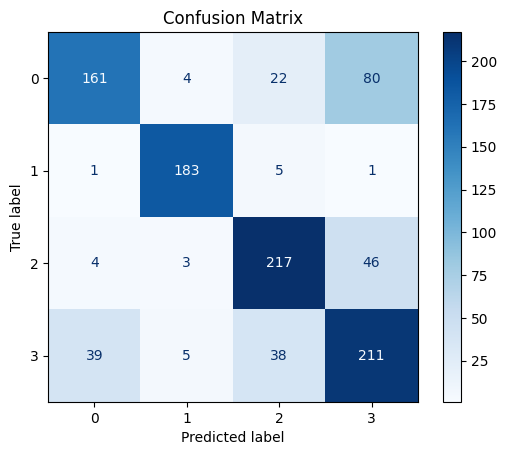

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm4 = confusion_matrix(y_true_np4, y_pred_np4)
disp4 = ConfusionMatrixDisplay(confusion_matrix=cm4)
disp4.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()


## Save and Load KAN model

In [ ]:
# save
model_kan_new.saveckpt('./KAN_3000steps_CNN30e_ALZ')

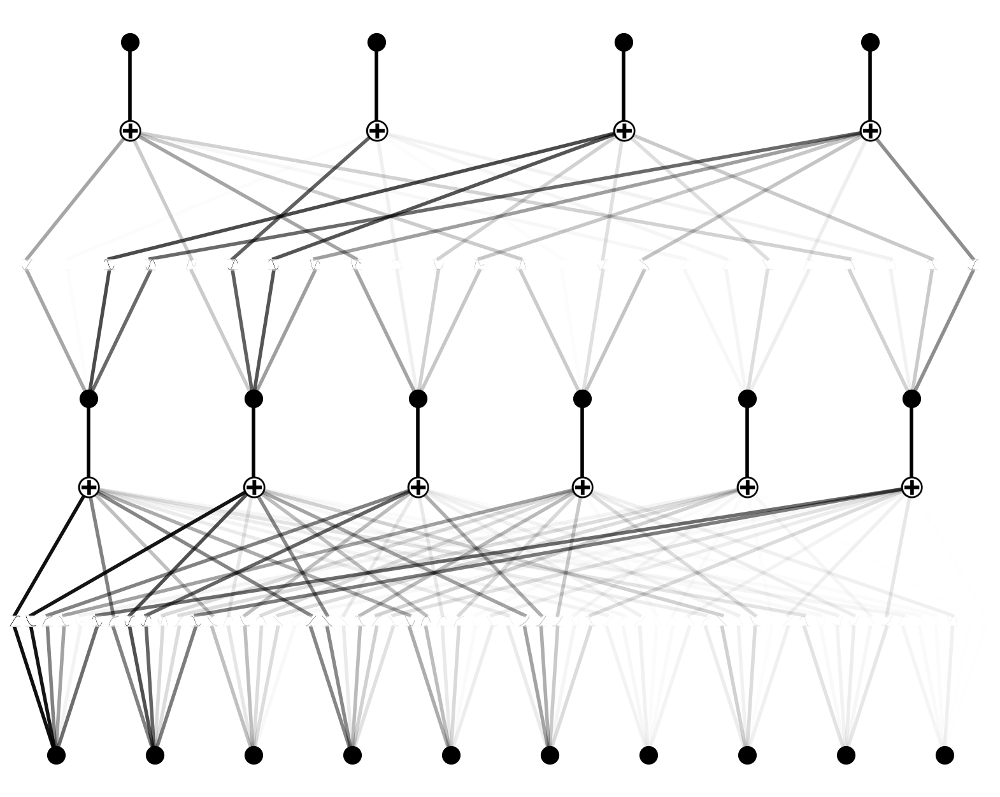

In [14]:
# load
model_kan = KAN.loadckpt('./KAN_3000steps_CNN30e_ALZ')
model_kan.plot(scale=2.0)

In [24]:
model_kan.feature_score

tensor([1.6370, 0.9761, 0.3040, 0.5580, 0.3101, 0.3918, 0.0714, 0.1721, 0.1294,
        0.0480], grad_fn=<MeanBackward1>)

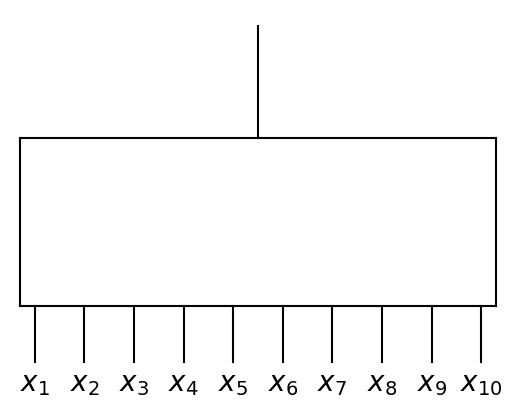

In [75]:
m = model_kan.copy()
m.tree()

# Model pruned and refined

In [ ]:
model_kan_2 = new_model.copy()

saving model version 2.12


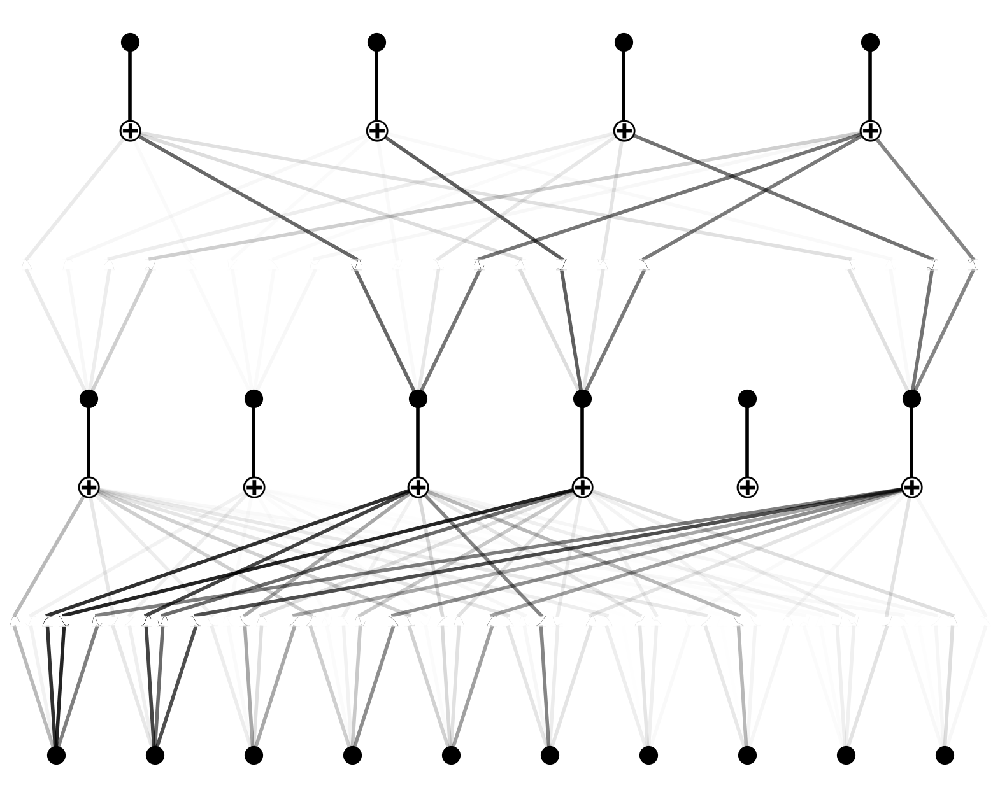

In [ ]:
model_kan_2.prune()
model_kan_2.plot(scale=2.0)

saving model version 2.12


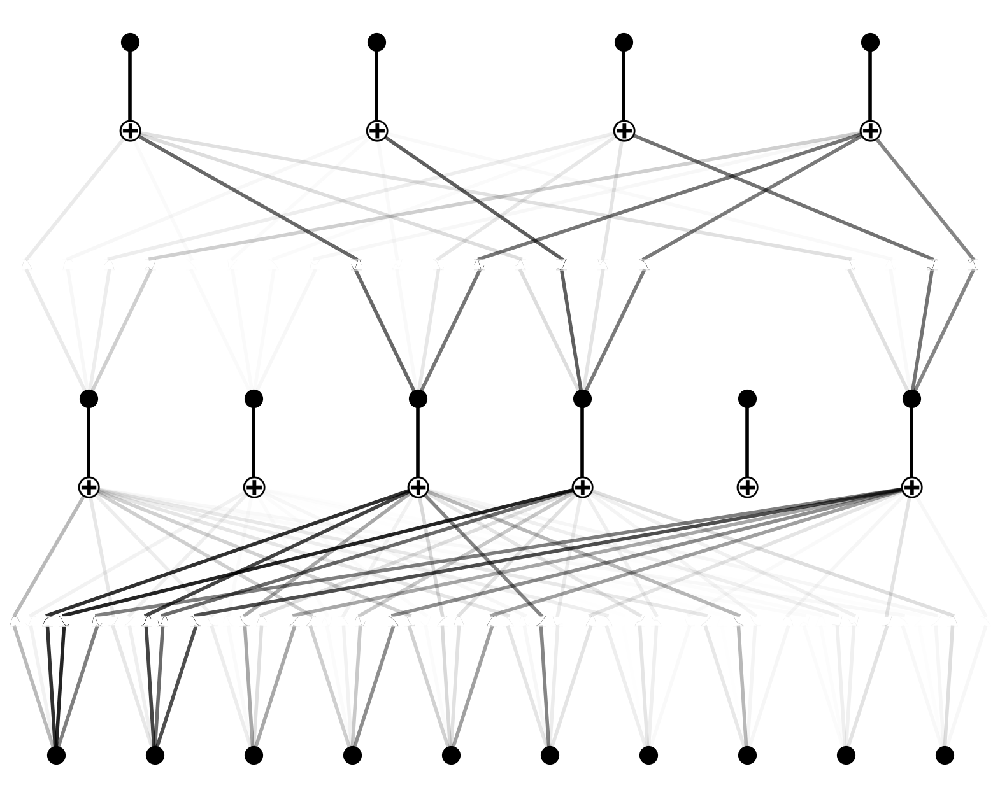

In [ ]:
model_kan_2.refine(10)
model_kan_2.plot(scale=2.0)

### Altri 1000 step nel modello pruned e refined(5)

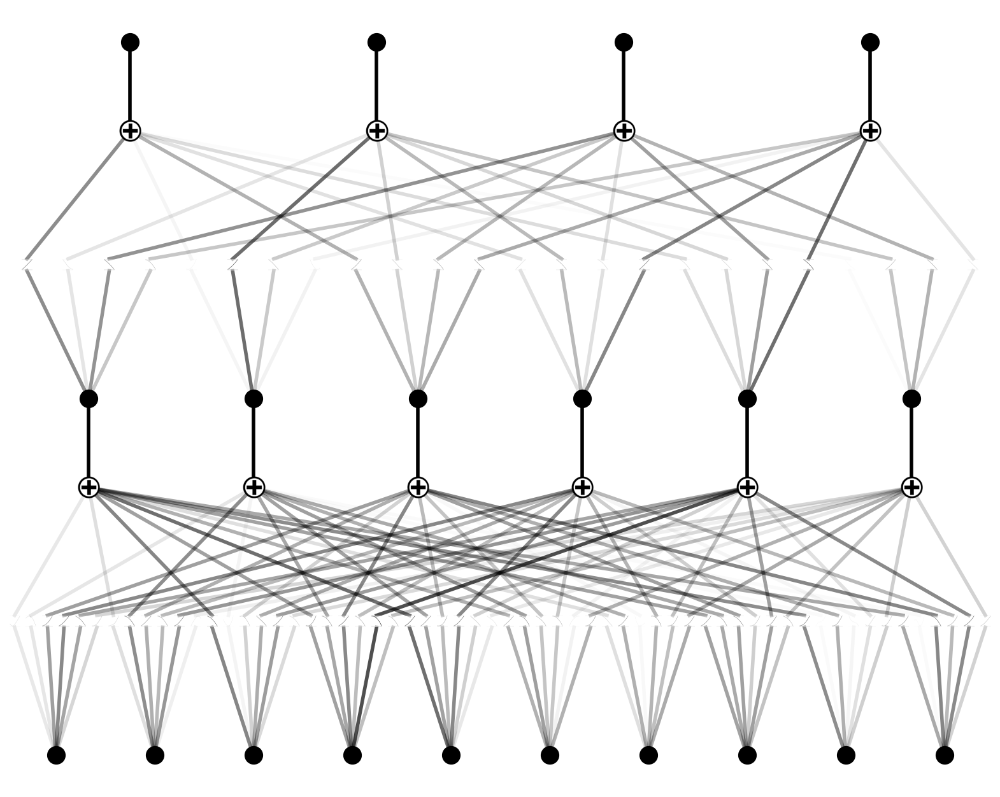

In [ ]:
# model_kan_2.fit(dataset, opt="Adam", steps=1000);
new_model(dataset['train_input'])
model_kan_2.plot(scale=2.0)

In [ ]:
model_kan_2.eval()  # modalità valutazione

with torch.no_grad():
    y_pred_kan_pruned = model_kan_2(dataset['test_input'])

y_true = torch.argmax(y_test_kan, dim=1)

y_pred_kan_pruned_labels = torch.argmax(y_pred_kan_pruned, dim=1)

accuracy_pru = (y_pred_kan_pruned_labels == y_true).float().mean()
print("Test Accuracy:", accuracy_pru.item())

Test Accuracy: 0.2666666805744171


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

y_true_np_pruned = y_true.cpu().numpy()
y_pred_np_pruned = y_pred_kan_pruned_labels.cpu().numpy()

print(confusion_matrix(y_true_np_pruned, y_pred_np_pruned))
print(classification_report(y_true_np_pruned, y_pred_np_pruned))


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm_pru = confusion_matrix(y_true_np_pruned, y_pred_np_pruned)
disp_pru = ConfusionMatrixDisplay(confusion_matrix=cm_pru)
disp_pru.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()


# Creazione nuova CNN di sola classificazione

In [ ]:
def defineCNN_class(X, Y,
                Dense_1_filters, Dense_1_activation, l1, l2,
                Dense_2_activation):

    # Definizione del modello di rete neurale convoluzionale (CNN) con regolarizzazione L2
    model_a = models.Sequential([
        layers.Dense(Dense_1_filters, activation=Dense_1_activation, kernel_regularizer=regularizers.l1_l2(l1=l1, l2=l2)),  # Aggiunta di regolarizzazione L2
        layers.Dense(Y.shape[1], activation=Dense_2_activation)
    ])



    # Compilazione del modello
    model_a.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])


    #model.summary()

    return model_a


In [ ]:
CNN_class = defineCNN_class(X_train_kan, y_train_kan,
                            Dense_1_filters=128, Dense_1_activation='relu', l1=0.001, l2=0.001,
                            Dense_2_activation='softmax')

In [ ]:
ep = 100
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using GPU:", torch.cuda.get_device_name(0))
    with tf.device('/device:GPU:0'):
      CNN_class.fit(X_train_kan, y_train_kan, epochs=ep, batch_size=32, validation_data=(X_test_kan, y_test_kan))
else:
    device = torch.device("cpu")
    print("Using CPU")
    CNN_class.fit(X_train_kan, y_train_kan, epochs=ep, batch_size=32, validation_data=(X_test_kan, y_test_kan))

Using CPU
Epoch 1/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9908 - loss: 0.2793 - val_accuracy: 0.7588 - val_loss: 0.7716
Epoch 2/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9915 - loss: 0.2644 - val_accuracy: 0.7608 - val_loss: 0.7741
Epoch 3/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9917 - loss: 0.2557 - val_accuracy: 0.7637 - val_loss: 0.7723
Epoch 4/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9931 - loss: 0.2442 - val_accuracy: 0.7598 - val_loss: 0.7713
Epoch 5/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9944 - loss: 0.2386 - val_accuracy: 0.7686 - val_loss: 0.7699
Epoch 6/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9934 - loss: 0.2306 - val_accuracy: 0.7647 - val_loss: 0.7700
Epoch 7/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9960 - loss: 0.2194 - val_accuracy: 0.7716 - val_loss: 0.7709
Epoch 8/100
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9946 - loss: 0.2149 

In [ ]:
y_pred_CNN1 = CNN_class.predict(X_test_kan)
y_true = np.argmax(Y_test, axis=1)
y_pred_CNN_labels1 = np.argmax(y_pred_CNN1, axis=1)

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


In [ ]:
y_pred_CNN1

array([[5.8995174e-05, 4.5060649e-05, 9.9295378e-01, 6.9422745e-03],
       [8.1447802e-02, 2.2670531e-07, 7.1631800e-03, 9.1138870e-01],
       [7.9968834e-07, 1.4057252e-05, 9.9967265e-01, 3.1248305e-04],
       ...,
       [4.8361868e-01, 6.9509356e-06, 6.6418108e-04, 5.1571023e-01],
       [5.9673551e-04, 9.7770023e-04, 4.9713120e-01, 5.0129431e-01],
       [9.9481328e-04, 1.5906300e-01, 4.6068408e-02, 7.9387373e-01]],
      dtype=float32)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

# y_true_np_CNN = y_true.cpu().numpy()
# y_pred_np_CNN = y_pred_CNN_labels.cpu().numpy()

print(confusion_matrix(y_true, y_pred_CNN_labels1))
print(classification_report(y_true, y_pred_CNN_labels1))

[[193   4  15  55]
 [  1 184   4   1]
 [ 10   4 214  42]
 [ 60   9  32 192]]
              precision    recall  f1-score   support

           0       0.73      0.72      0.73       267
           1       0.92      0.97      0.94       190
           2       0.81      0.79      0.80       270
           3       0.66      0.66      0.66       293

    accuracy                           0.77      1020
   macro avg       0.78      0.78      0.78      1020
weighted avg       0.77      0.77      0.77      1020



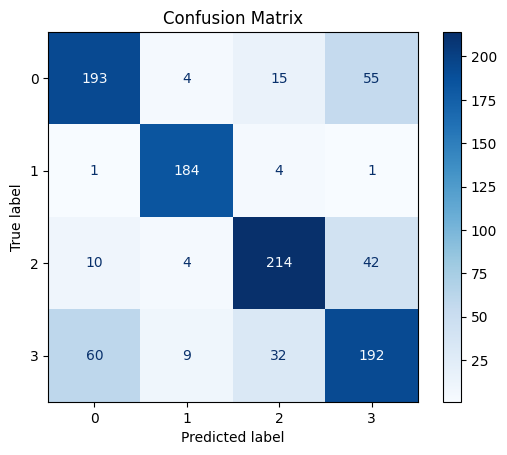

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm_CNN1 = confusion_matrix(y_true, y_pred_CNN_labels1)
disp_CNN1 = ConfusionMatrixDisplay(confusion_matrix=cm_CNN1)
disp_CNN1.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()